### experimentaion on Unet achitecture with different encoders:
1. Generic Unet(no pretrained encoders)
2. VGG16 (retrain all layer)
3. ResNet50 (retrain all layer) 
4. ResNet50 (freeze first two conv blocks) 

In [1]:
import os
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
%matplotlib inline

import cv2
from glob import glob
from itertools import chain

from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from skimage.color import rgb2gray
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import Input
from tensorflow.keras.models import Model, load_model, save_model
from tensorflow.keras.layers import Input, Activation, BatchNormalization,UpSampling2D, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers.schedules import PolynomialDecay

from tensorflow.keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


### Loading the image and mask paths

In [2]:
# Setting size parameters of images
im_width = 256
im_height = 256

In [3]:
image_filenames_train = []

# creating a list of all files containing the word 'mask'
mask_files = glob('/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/*/*_mask*')

for i in mask_files:
    image_filenames_train.append(i.replace('_mask', ''))

print(image_filenames_train[:10])
len(image_filenames_train)

['/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_8.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_34.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_33.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_43.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_39.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_7.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_31.tif', '/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_6.tif', '/kaggle/inp

3929

### Plotting few images and masks

In [22]:
mask_files[0]

'/kaggle/input/image-data/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56_mask.tif'

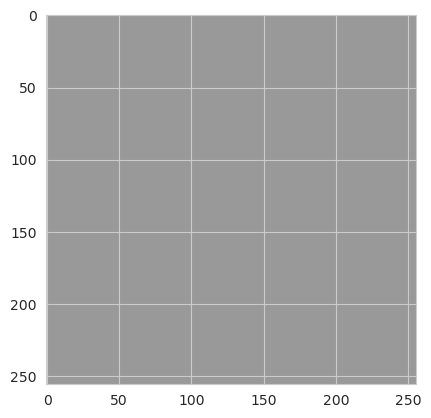

In [23]:
mask = cv2.imread(mask_files[0])
plt.imshow(mask, alpha=0.4)

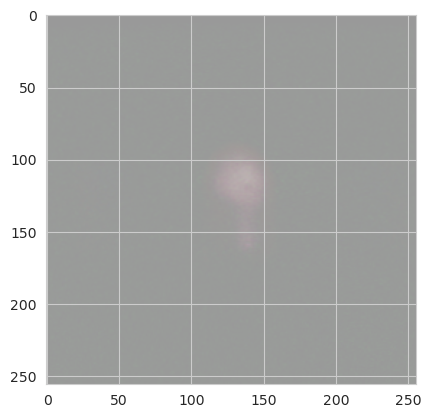

In [6]:
img = cv2.imread(image_filenames_train[0])
plt.imshow(img, alpha=0.4)

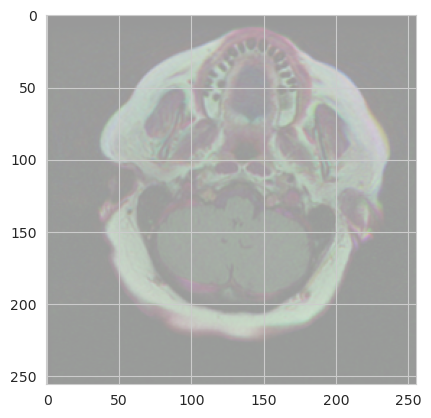

In [7]:
img = cv2.imread(image_filenames_train[1])
plt.imshow(img, alpha=0.4)

In [4]:
#a custome function to plot images form img_path
def plot_from_img_path(rows, columns, list_img_path, list_mask_path):
    fig = plt.figure(figsize=(12, 12))
    for i in range(1, rows * columns + 1):
        fig.add_subplot(rows, columns, i)
        img_path = list_img_path[i]
        mask_path = list_mask_path[i]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.4)
    plt.show()

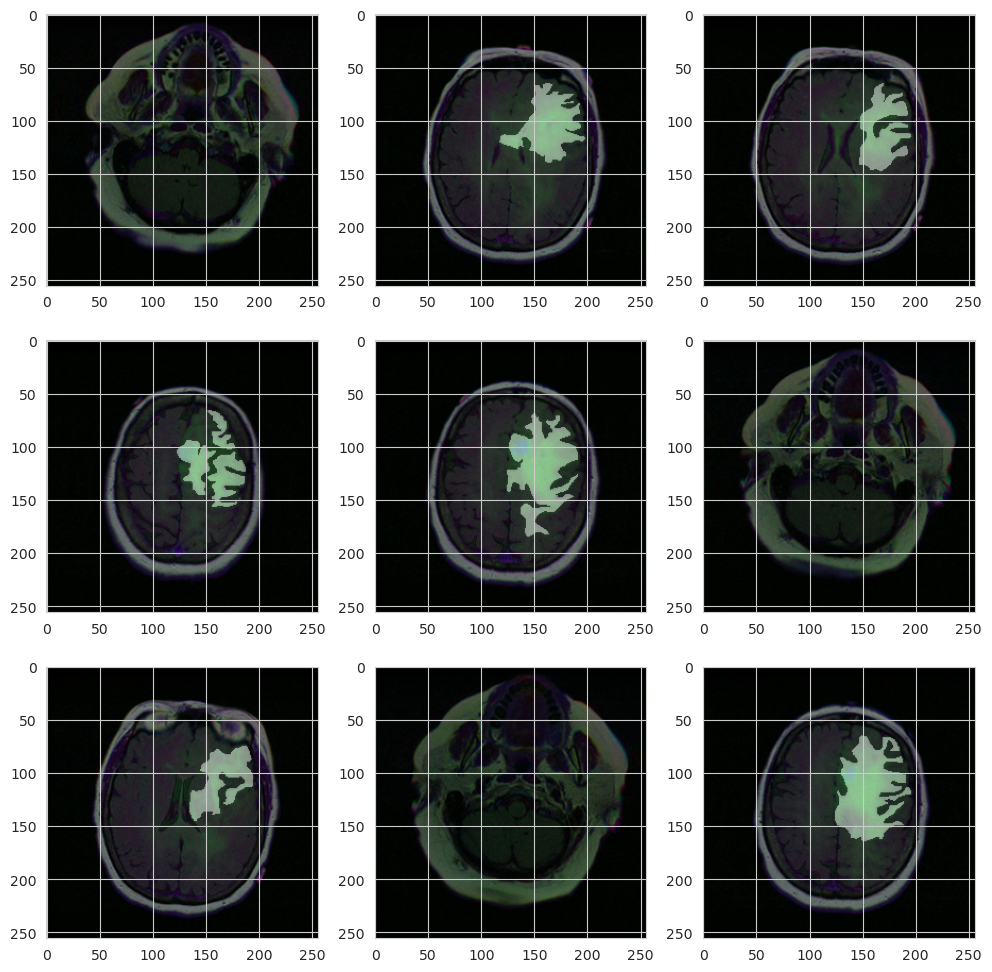

In [9]:
plot_from_img_path(3, 3 , image_filenames_train, mask_files )

### Create data frame and train test split

In [11]:
df = pd.DataFrame(data={'image_filenames_train': image_filenames_train, 'mask': mask_files })

df_train, df_test = train_test_split(df, test_size=0.1)

# Further split this val and train
df_train, df_val = train_test_split(df_train, test_size=0.2)

print(df_train.shape)
print(df_test.shape)
print(df_val.shape)

(2828, 2)
(393, 2)
(708, 2)


### Data genertator, data augmentation and adjust data

In [12]:
# Referring Code From: https://github.com/zhixuhao/unet/blob/master/data.py
def train_generator(
    data_frame,
    batch_size,
    augmentation_dict,
    image_color_mode="rgb",
    mask_color_mode="grayscale",
    image_save_prefix="image",
    mask_save_prefix="mask",
    save_to_dir=None,
    target_size=(256, 256),
    seed=1,
):
    """
    can generate image and mask at the same time use the same seed for
    image_datagen and mask_datagen to ensure the transformation for image
    and mask is the same if you want to visualize the results of generator,
    set save_to_dir = "your path"
    """
    image_datagen = ImageDataGenerator(**augmentation_dict)
    mask_datagen = ImageDataGenerator(**augmentation_dict)

    image_generator = image_datagen.flow_from_dataframe(
        data_frame,
        x_col="image_filenames_train",
        class_mode=None,
        color_mode=image_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=image_save_prefix,
        seed=seed,
    )
    mask_generator = mask_datagen.flow_from_dataframe(
        data_frame,
        x_col="mask",
        class_mode=None,
        color_mode=mask_color_mode,
        target_size=target_size,
        batch_size=batch_size,
        save_to_dir=save_to_dir,
        save_prefix=mask_save_prefix,
        seed=seed,
    )

    train_gen = zip(image_generator, mask_generator)
    
    # Final return Tuple after image Normalization and Diagnostics
    for (img, mask) in train_gen:
        img, mask = normalize_and_diagnose(img, mask)
        yield (img, mask)

In [13]:
''' After mask Normalization if the value is <= 0.5 then that Mask 
will be considered a complete black one and does not have any Tumor '''
def normalize_and_diagnose(img, mask):
    img = img / 255
    mask = mask / 255
    mask[mask > 0.5] = 1
    mask[mask <= 0.5] = 0
    return(img, mask)

In [8]:
def conv_block(inputs, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def encoder_block(inputs, num_filters):
    x = conv_block(inputs, num_filters)
    p = MaxPooling2D((2, 2))(x)
    return x, p

def decoder_block(inputs, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, 2, strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)
    s4, p4 = encoder_block(p3, 512)

    b1 = conv_block(p4, 1024)

    d1 = decoder_block(b1, s4, 512)
    d2 = decoder_block(d1, s3, 256)
    d3 = decoder_block(d2, s2, 128)
    d4 = decoder_block(d3, s1, 64)

    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="UNET")
    return model

if __name__ == "__main__":
    input_shape = (256, 256, 3)
    model = build_unet(input_shape)
    model.summary()

Model: "UNET"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               

                                )]                                                                

                                                                                                  

 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input_1[0][0]']                

                                )                                                                 

                                                                                                  

 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 

 alization)                     )                                                   

In [15]:
def dice_coef(y_true, y_pred, smooth=1):
    """
    Dice = (2*|X & Y|)/ (|X|+ |Y|)
         =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
    """
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection + smooth) / (K.sum(K.square(y_true),-1) + K.sum(K.square(y_pred),-1) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

def iou(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

In [16]:
BATCH_SIZE = 32

In [17]:
train_generator_param = dict(rotation_range=0.2,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = train_generator(df_train, BATCH_SIZE,
                                train_generator_param,
                                target_size=(im_height, im_width))
    
val_gen = train_generator(df_val, BATCH_SIZE,
                                dict(),
                                target_size=(im_height, im_width))


#### two plot function

In [6]:
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 10)
# Plotting training curves
def plot_metrics(history):
  metrics = ['loss', "binary_accuracy", "iou", "dice_coef"]
  for n, metric in enumerate(metrics):
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch, history.history[metric], 'y', label='Train')
    plt.plot(history.epoch, history.history['val_'+metric], 'r', linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.legend()

In [24]:
# Plotting Predicted Masks Segmentation results from the Test Image set
def plot_segmentation_result(model):
    for i in range(20):
        index = np.random.randint(1, len(df_test.index))
        img = cv2.imread(df_test['image_filenames_train'].iloc[index])
        img = cv2.resize(img, (im_height, im_width))
        img = img/255
        # print(imgs.shape) (256, 256 , 3)
        img = img[np.newaxis, :, :, : ]
        # print(img.shape) # (1, 256, 256, 3)

        predicted_img = model.predict(img)

        plt.figure(figsize=(12, 12))
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(img))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
        plt.title('Original Mask')

        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predicted_img) > 0.5 )
        plt.title('Prediction')
        plt.show()

### Generic Unet modelV1--120 epochs

In [19]:
input_shape = (256, 256, 3)
model_unet_V1 = build_unet(input_shape)

In [20]:
model_unet_V1.summary()

Model: "UNET"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               

                                )]                                                                

                                                                                                  

 conv2d_38 (Conv2D)             (None, 256, 256, 64  1792        ['input_3[0][0]']                

                                )                                                                 

                                                                                                  

 batch_normalization_36 (BatchN  (None, 256, 256, 64  256        ['conv2d_38[0][0]']              

 ormalization)                  )                                                   

In [21]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=1e-4,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
callbacks_unet_V1 = [ModelCheckpoint('unet_150_epochs.hdf5', verbose=1,
                                      save_best_only=True)]
metrics=["binary_accuracy", iou, dice_coef]

In [22]:
model_unet_V1.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)

In [23]:
history_unet_V1 = model_unet_V1.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_unet_V1,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.

Found 2828 validated image filenames.

Epoch 1/120

89/88 [==============================] - ETA: -1s - loss: 0.0244 - binary_accuracy: 0.9660 - iou: 0.0480 - dice_coef: 0.9756Found 708 validated image filenames.

Found 708 validated image filenames.



Epoch 1: val_loss improved from inf to 0.41454, saving model to unet_150_epochs.hdf5

88/88 [==============================] - 236s 2s/step - loss: 0.0244 - binary_accuracy: 0.9660 - iou: 0.0480 - dice_coef: 0.9756 - val_loss: 0.4145 - val_binary_accuracy: 0.1609 - val_iou: 0.0108 - val_dice_coef: 0.5855

Epoch 2/120

89/88 [==============================] - ETA: -1s - loss: 0.0062 - binary_accuracy: 0.9900 - iou: 0.0658 - dice_coef: 0.9938

Epoch 2: val_loss improved from 0.41454 to 0.03401, saving model to unet_150_epochs.hdf5

88/88 [==============================] - 179s 2s/step - loss: 0.0062 - binary_accuracy: 0.9900 - iou: 0.0658 - dice_coef: 0.9938 - val_loss: 0.0340 - val_binary_accuracy: 

In [24]:
model_unet_V1.save('model_unet_V1-9th.h5')

In [33]:
np.save('unet_V1_history.npy',history_unet_V1.history)

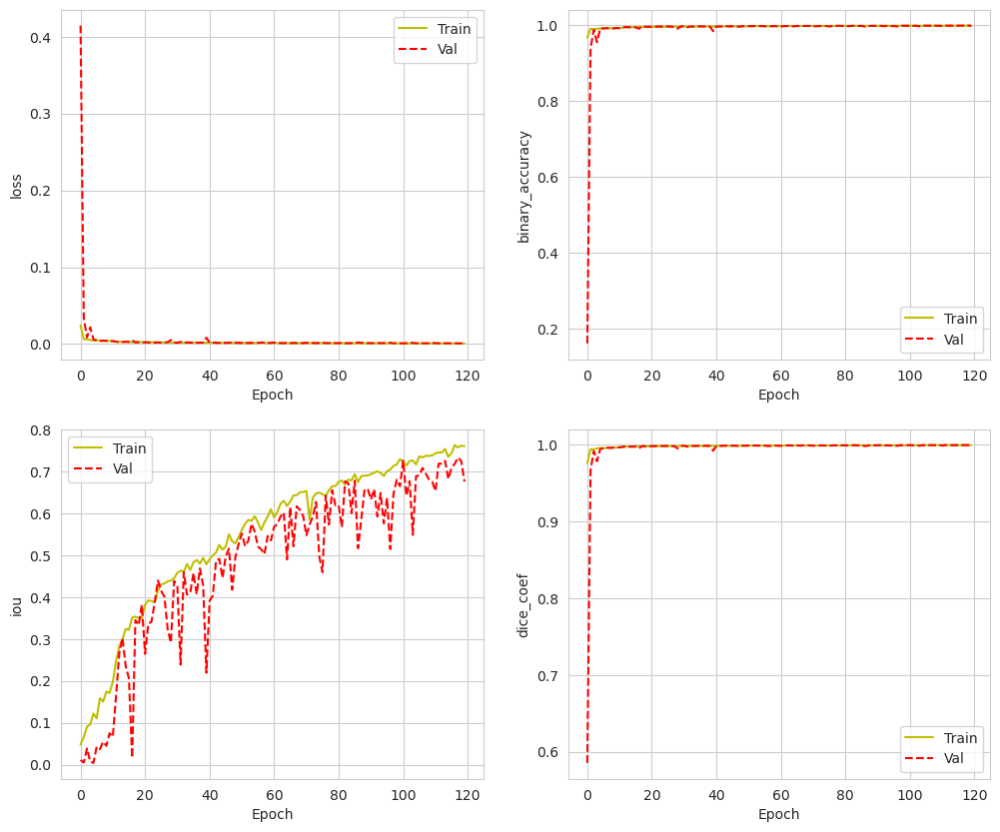

In [28]:
plot_metrics(history_unet_V1)

In [29]:
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))

results_unet = model_unet_V1.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results[0] )
print('Test Binary Accuracy ', results[1] )
print('Test IoU ', results[2] )
print('Test Dice Coefficient ', results[3] )

Found 393 validated image filenames.

Found 393 validated image filenames.

12/12 [==============================] - 11s 929ms/step - loss: 7.1377e-04 - binary_accuracy: 0.9983 - iou: 0.7030 - dice_coef: 0.9993

Test Loss  0.0007137746433727443

Test Binary Accuracy  0.9982790350914001

Test IoU  0.703022301197052

Test Dice Coefficient  0.9992862939834595


In [31]:
def plot_segmentation_result(model):
    for i in range(20):
        index = np.random.randint(1, len(df_test.index))
        img = cv2.imread(df_test['image_filenames_train'].iloc[index])
        img = cv2.resize(img, (im_height, im_width))
        img = img/255
        # print(imgs.shape) (256, 256 , 3)
        img = img[np.newaxis, :, :, : ]
        # print(img.shape) # (1, 256, 256, 3)

        predicted_img = model.predict(img)

        plt.figure(figsize=(12, 12))
        plt.subplot(1, 3, 1)
        plt.imshow(np.squeeze(img))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(np.squeeze(cv2.imread(df_test['mask'].iloc[index])))
        plt.title('Original Mask')

        plt.subplot(1, 3, 3)
        plt.imshow(np.squeeze(predicted_img) > 0.5 )
        plt.title('Prediction')
        plt.show()

1/1 [==============================] - 2s 2s/step


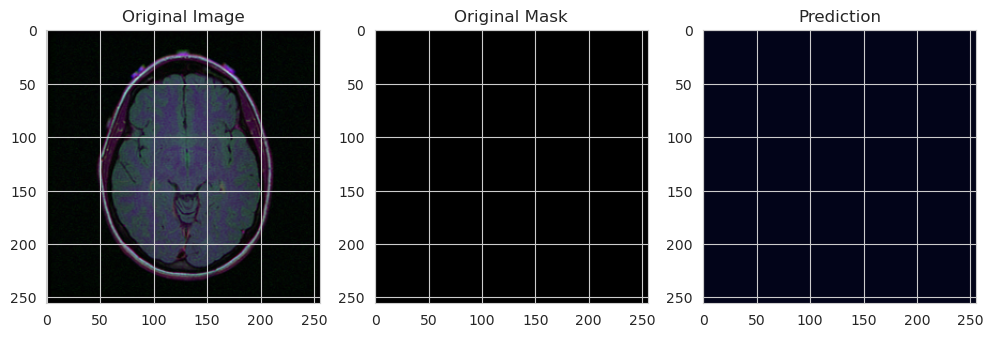

1/1 [==============================] - 0s 24ms/step


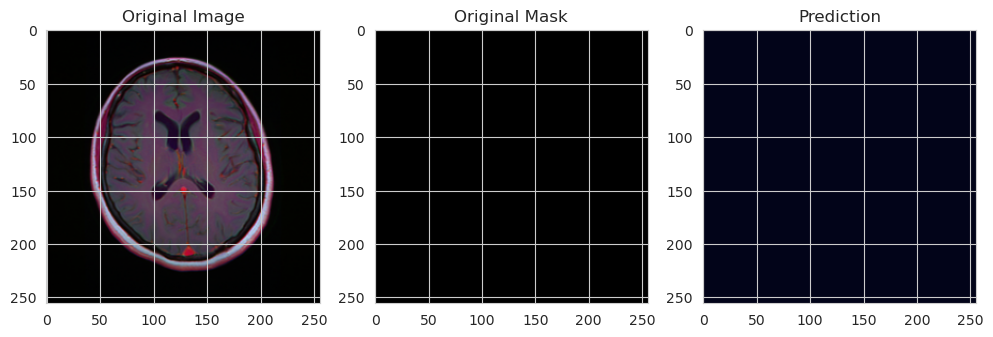

1/1 [==============================] - 0s 26ms/step


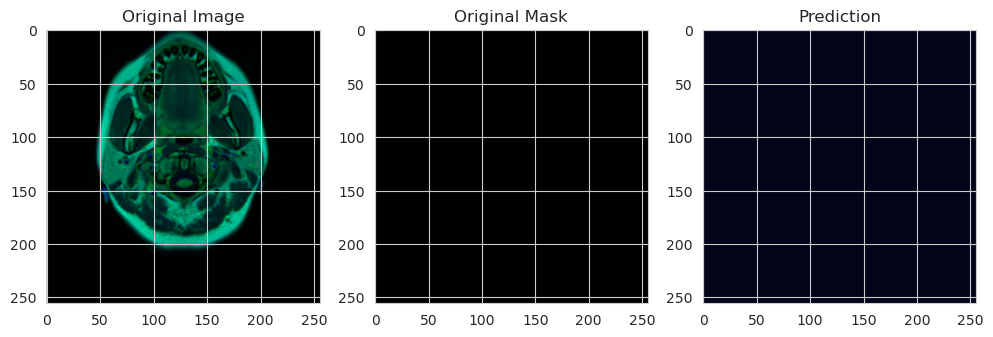

1/1 [==============================] - 0s 25ms/step


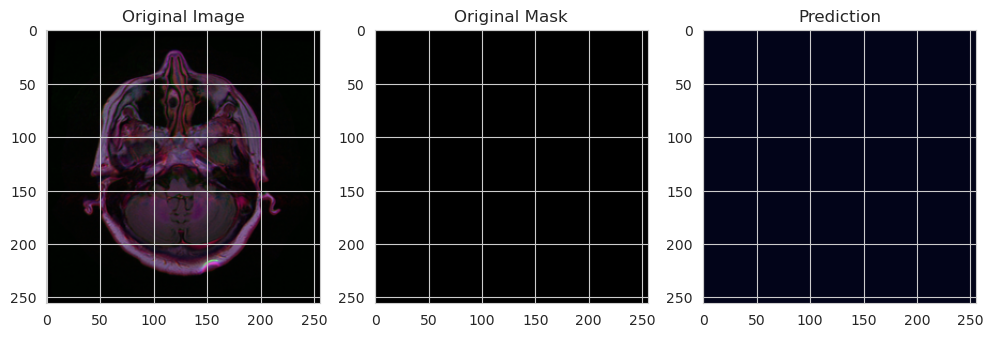

1/1 [==============================] - 0s 27ms/step


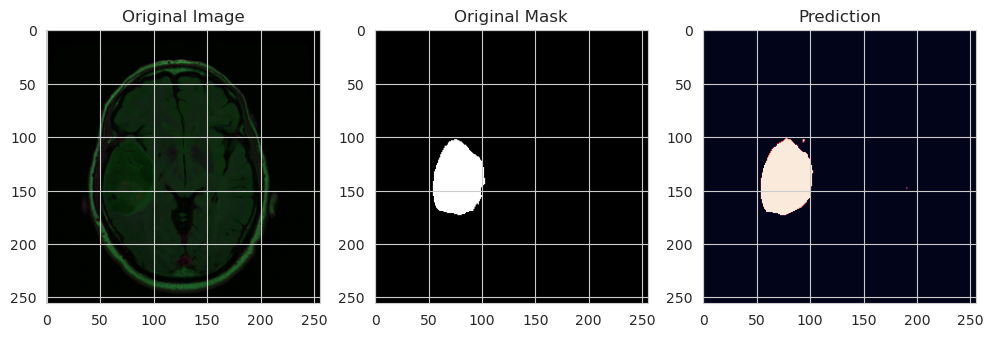

1/1 [==============================] - 0s 26ms/step


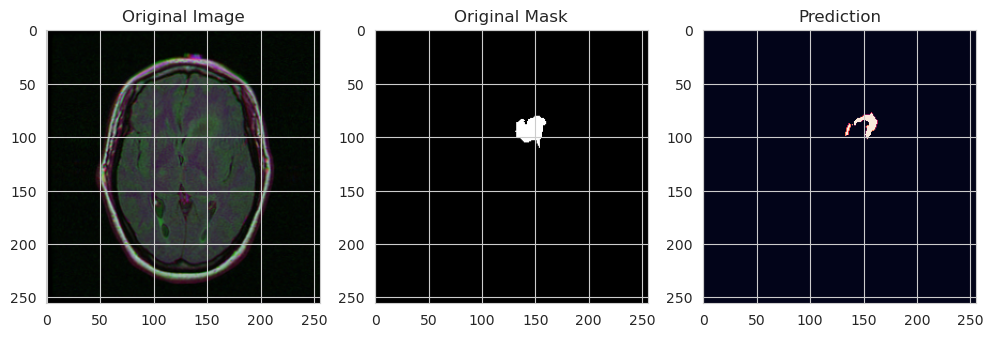

1/1 [==============================] - 0s 25ms/step


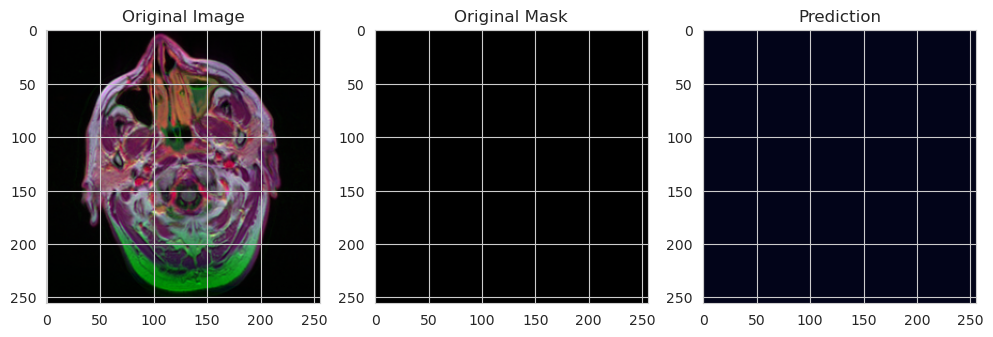

1/1 [==============================] - 0s 26ms/step


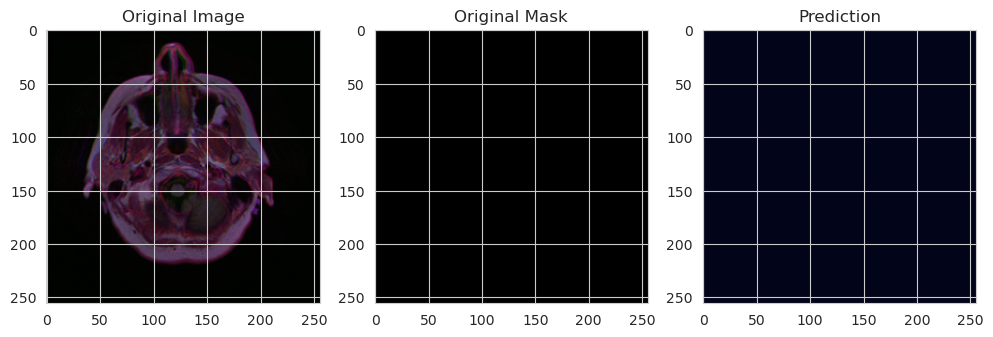

1/1 [==============================] - 0s 26ms/step


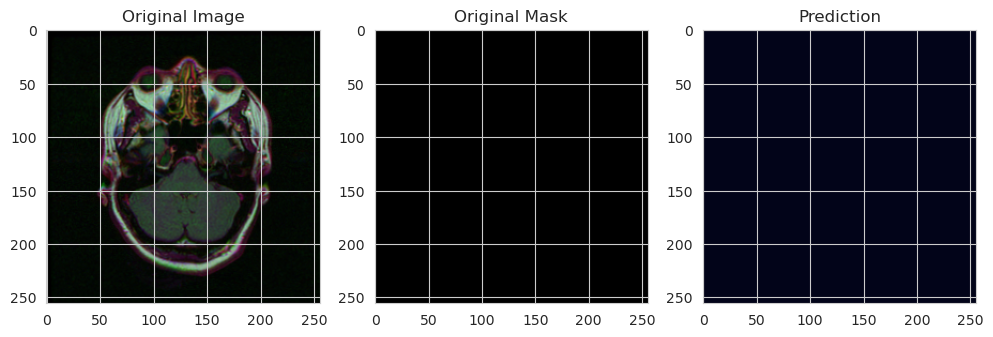

1/1 [==============================] - 0s 25ms/step


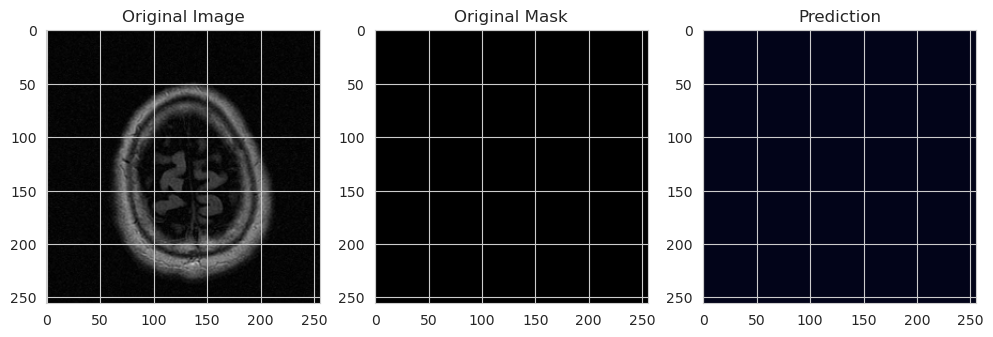

1/1 [==============================] - 0s 26ms/step


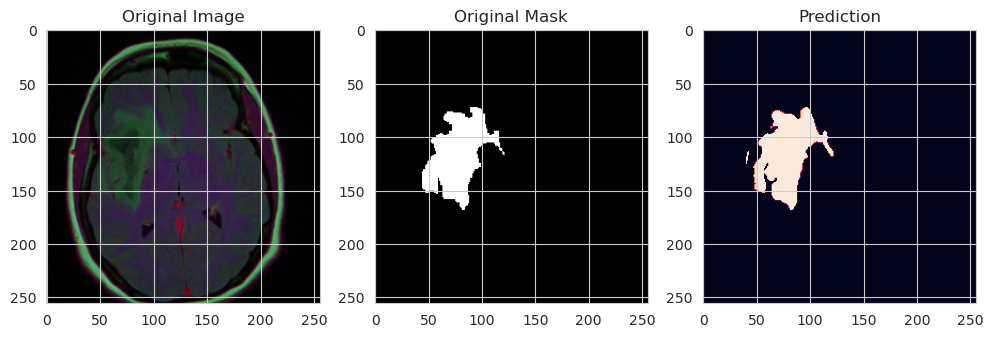

1/1 [==============================] - 0s 28ms/step


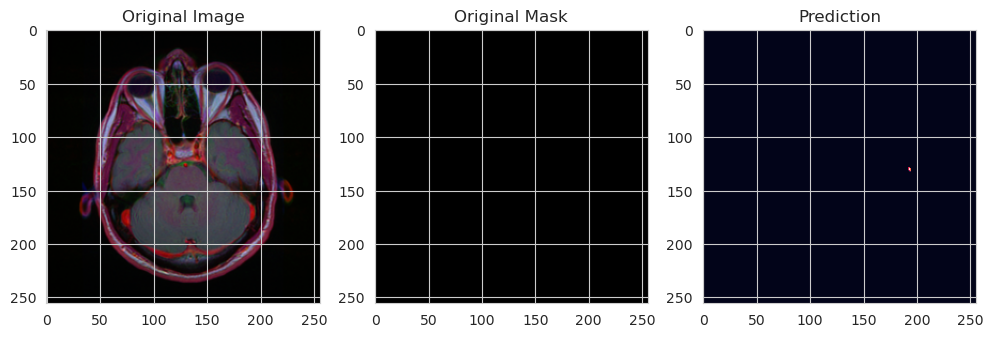

1/1 [==============================] - 0s 25ms/step


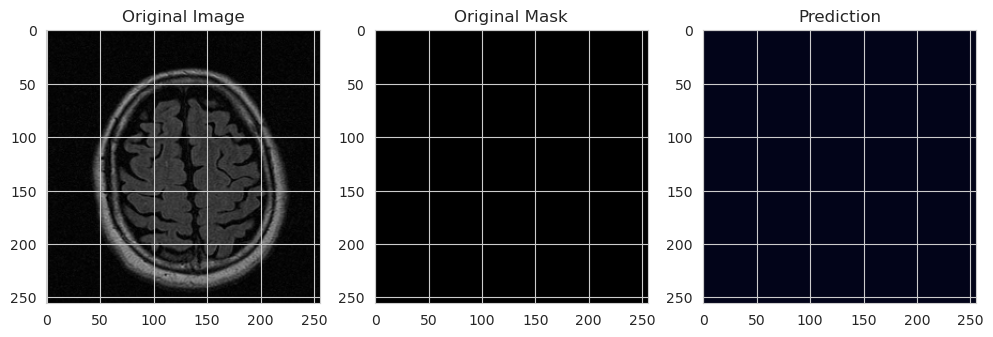

1/1 [==============================] - 0s 25ms/step


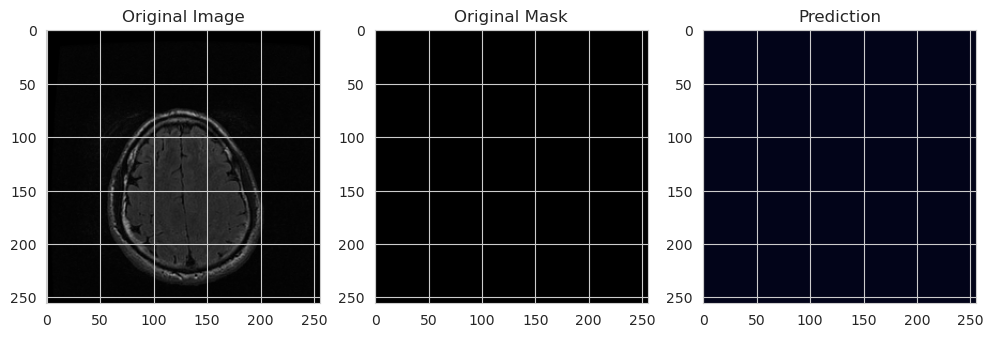

1/1 [==============================] - 0s 24ms/step


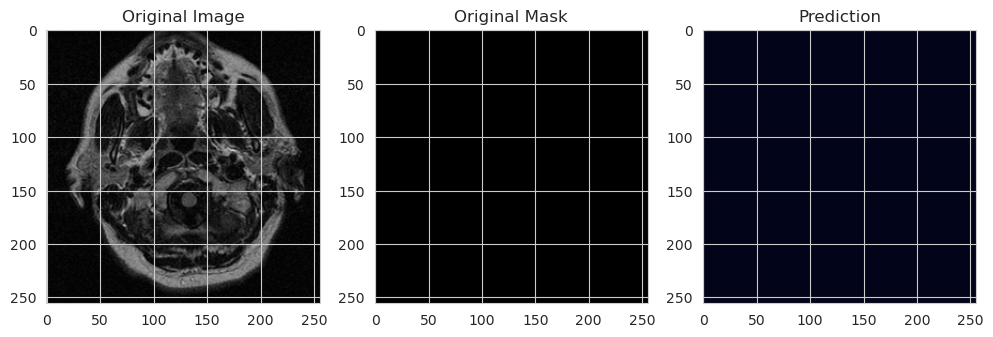

1/1 [==============================] - 0s 25ms/step


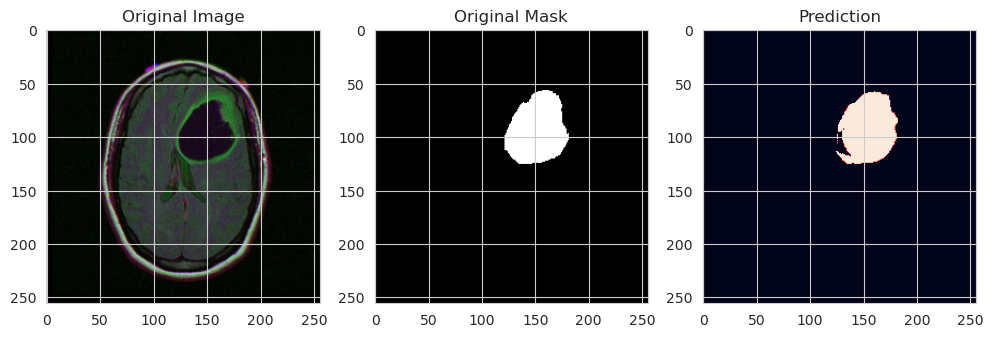

1/1 [==============================] - 0s 24ms/step


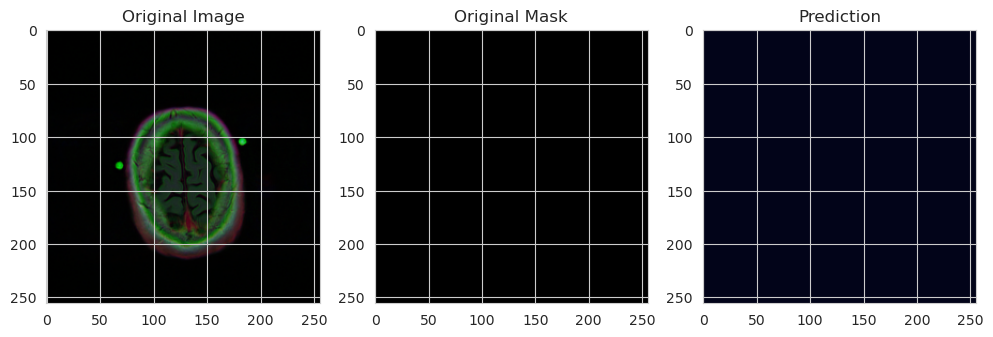

1/1 [==============================] - 0s 25ms/step


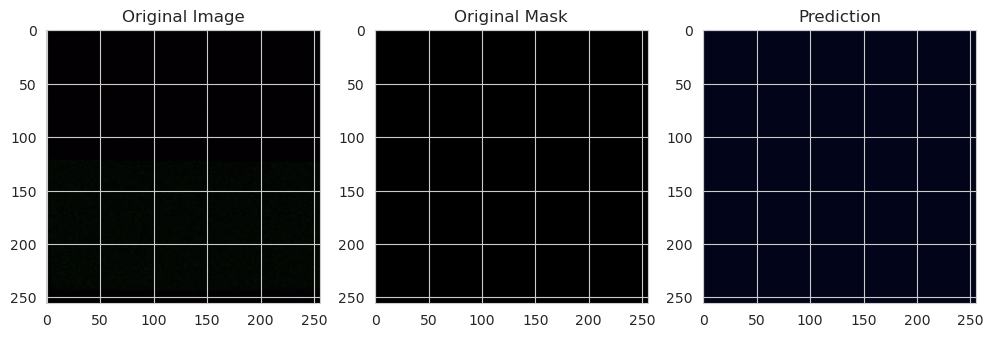

1/1 [==============================] - 0s 25ms/step


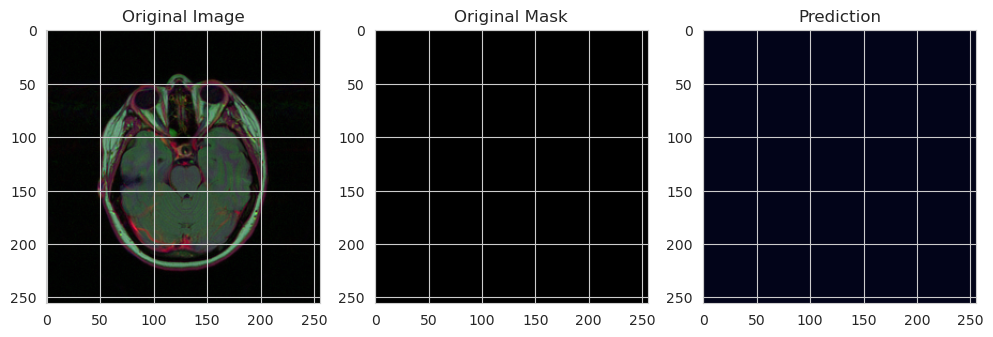

1/1 [==============================] - 0s 25ms/step


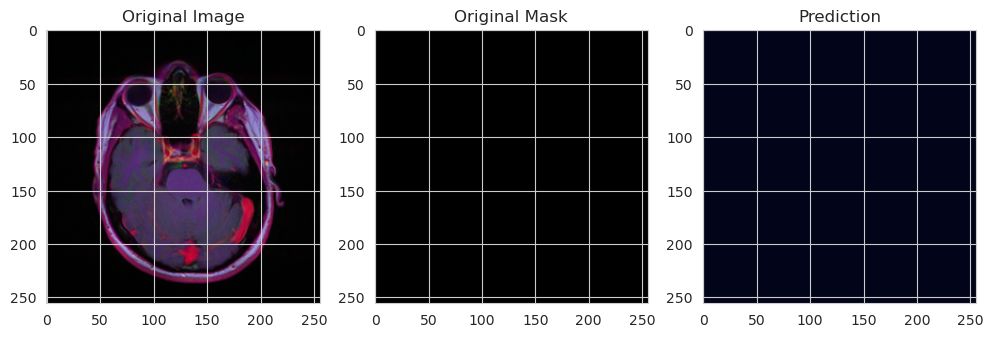

In [32]:
plot_segmentation_result(model_unet_V1)

### vgg16 (retrain all layer)

In [19]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
 
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
 
    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
 
    return x
 
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x
 
def build_vgg16_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)
 
    """ Pre-trained VGG16 Model """
    vgg16 = VGG16(include_top=False, weights="imagenet", input_tensor=inputs)
 
    """ Encoder """
    s1 = vgg16.get_layer("block1_conv2").output         ## (512 x 512)
    s2 = vgg16.get_layer("block2_conv2").output         ## (256 x 256)
    s3 = vgg16.get_layer("block3_conv3").output         ## (128 x 128)
    s4 = vgg16.get_layer("block4_conv3").output         ## (64 x 64)
 
    """ Bridge """
    b1 = vgg16.get_layer("block5_conv3").output         ## (32 x 32)
 
    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)
 
    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
 
    model = Model(inputs, outputs, name="VGG16_U-Net")
    return model


In [21]:
model_vgg=build_vgg16_unet(input_shape)
model_vgg.summary()


58889256/58889256 [==============================] - 0s 0us/step

Model: "VGG16_U-Net"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               

                                )]                                                                

                                                                                                  

 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_3[0][0]']                

                                )                                                                 

                                                                                                  

 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           

          

In [22]:
from keras.callbacks import ReduceLROnPlateau
callbacks_vgg = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(monitor='val_loss',factor=0.2, patience=5, min_lr=1e-5, verbose=1),
    ModelCheckpoint('vgg.h5', verbose=1, save_best_only=True)
]
metrics=["binary_accuracy", iou, dice_coef]


In [23]:
model_vgg.compile(optimizer=Adam(), loss=dice_coef_loss, 
              metrics=metrics)

In [24]:
BATCH_SIZE = 32

history_vgg = model_vgg.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.

Found 2828 validated image filenames.

Epoch 1/120

89/88 [==============================] - ETA: -1s - loss: 0.0333 - binary_accuracy: 0.9552 - iou: 0.0340 - dice_coef: 0.9667Found 708 validated image filenames.

Found 708 validated image filenames.



Epoch 1: val_loss improved from inf to 0.23224, saving model to vgg.h5

88/88 [==============================] - 222s 2s/step - loss: 0.0333 - binary_accuracy: 0.9552 - iou: 0.0340 - dice_coef: 0.9667 - val_loss: 0.2322 - val_binary_accuracy: 0.4834 - val_iou: 0.0139 - val_dice_coef: 0.7678 - lr: 0.0010

Epoch 2/120

89/88 [==============================] - ETA: -1s - loss: 0.0062 - binary_accuracy: 0.9906 - iou: 0.0632 - dice_coef: 0.9938

Epoch 2: val_loss improved from 0.23224 to 0.00960, saving model to vgg.h5

88/88 [==============================] - 173s 2s/step - loss: 0.0062 - binary_accuracy: 0.9906 - iou: 0.0632 - dice_coef: 0.9938 - val_loss: 0.0096 - val_binary_accuracy: 0.9912 - val_io

In [ ]:
from keras.callbacks import ReduceLROnPlateau
callbacks_vgg0 = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(monitor='val_loss',factor=0.5, patience=10, min_lr=1e-5, verbose=1),
    ModelCheckpoint('vgg0.h5', verbose=1, save_best_only=True)
]
metrics=["binary_accuracy", iou, dice_coef]


In [19]:
EPOCHS=120
BATCH_SIZE = 32
history_vgg = model_vgg.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    batch_size=BATCH_SIZE,
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg0,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.



Found 2828 validated image filenames.



Epoch 1/20



89/88 [==============================] - ETA: -1s - loss: 0.0483 - binary_accuracy: 0.9648 - iou: 0.0294 - dice_coef: 0.9517Found 708 validated image filenames.



Found 708 validated image filenames.







Epoch 1: val_loss improved from inf to 0.09858, saving model to vgg.hdf5



88/88 [==============================] - 221s 2s/step - loss: 0.0483 - binary_accuracy: 0.9648 - iou: 0.0294 - dice_coef: 0.9517 - val_loss: 0.0986 - val_binary_accuracy: 0.9696 - val_iou: 0.0264 - val_dice_coef: 0.9014



Epoch 2/20



89/88 [==============================] - ETA: 0s - loss: 0.0110 - binary_accuracy: 0.9923 - iou: 0.0603 - dice_coef: 0.9890



Epoch 2: val_loss did not improve from 0.09858



88/88 [==============================] - 161s 2s/step - loss: 0.0110 - binary_accuracy: 0.9923 - iou: 0.0603 - dice_coef: 0.9890 - val_loss: 0.2942 - val_binary_accuracy: 0.4000 - val_iou: 0.0140 - val_dice

In [21]:
model_vggV0.save('vgg16V0.hdf5')

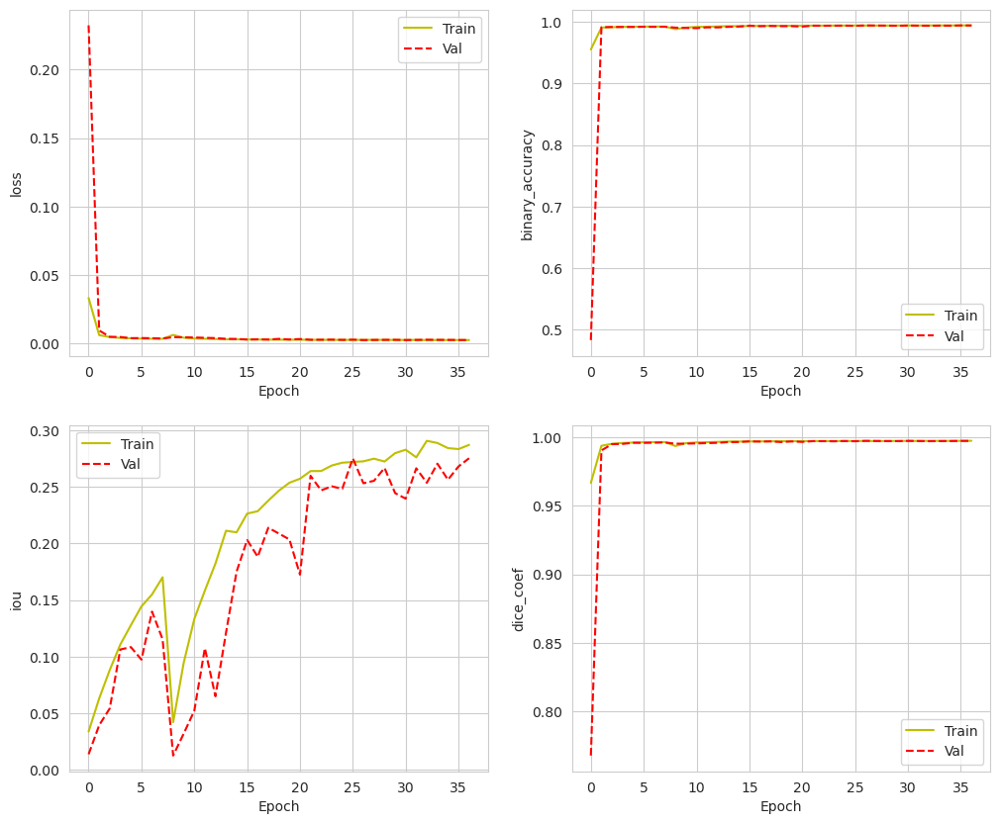

In [33]:
plot_metrics(history_vggV0)

In [34]:
#Evaluate trained vgg model
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
results_vggV0 = model_vggV0.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_vgg[0] )
print('Test Binary Accuracy ', results_vgg[1] )
print('Test IoU ', results_vgg[2] )
print('Test Dice Coefficient ', results_vgg[3] )

Found 393 validated image filenames.

Found 393 validated image filenames.

12/12 [==============================] - 11s 944ms/step - loss: 0.0027 - binary_accuracy: 0.9939 - iou: 0.2841 - dice_coef: 0.9973

Test Loss  0.0026593885850161314

Test Binary Accuracy  0.9939333200454712

Test IoU  0.28412601351737976

Test Dice Coefficient  0.9973406195640564


1/1 [==============================] - 2s 2s/step


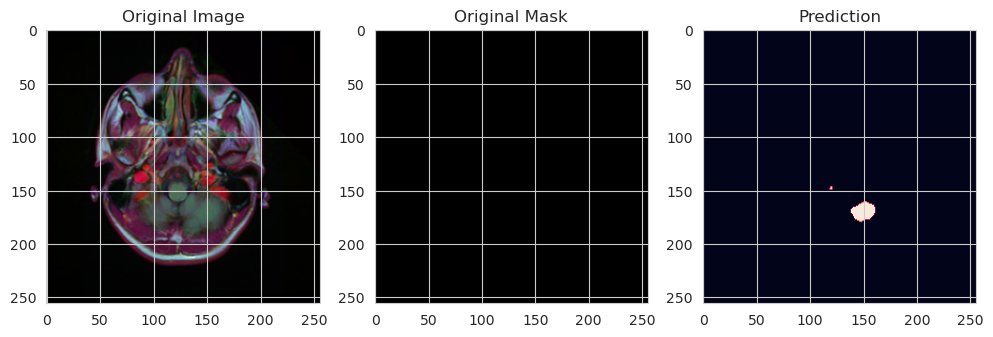

1/1 [==============================] - 0s 29ms/step


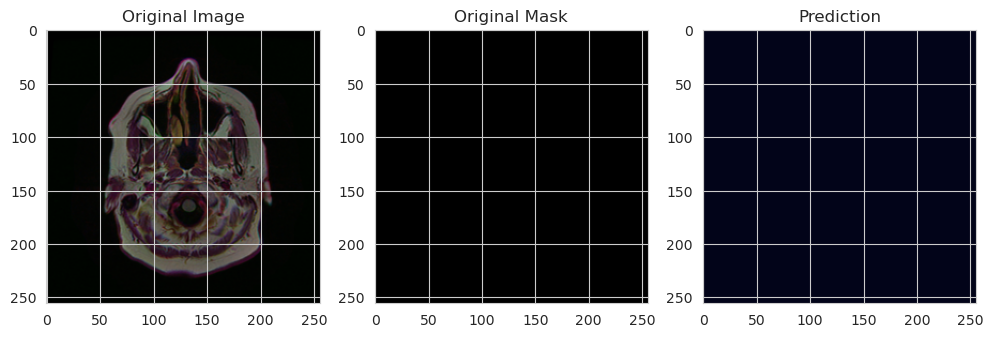

1/1 [==============================] - 0s 28ms/step


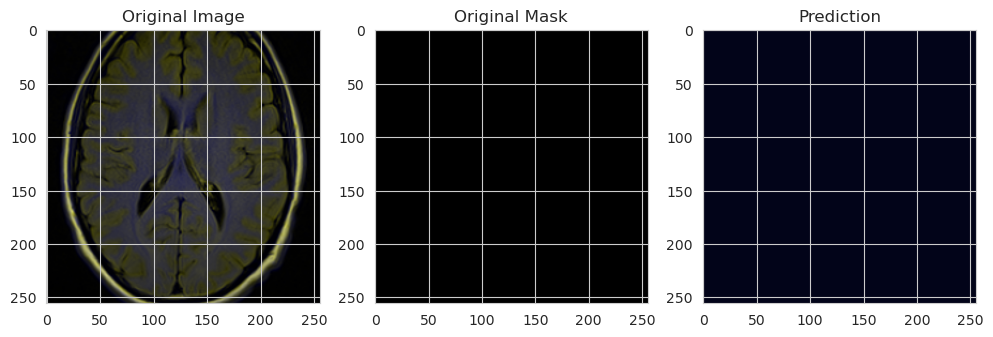

1/1 [==============================] - 0s 26ms/step


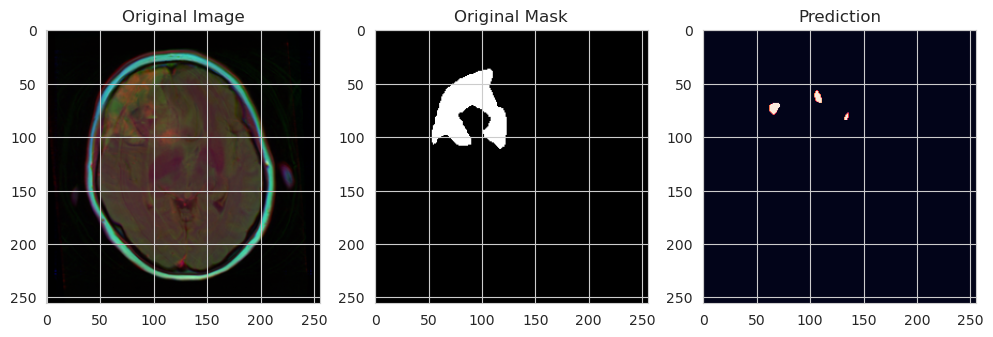

1/1 [==============================] - 0s 27ms/step


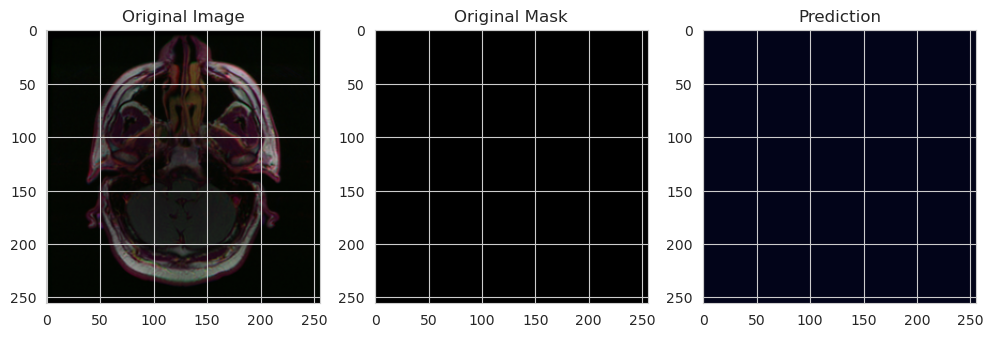

1/1 [==============================] - 0s 26ms/step


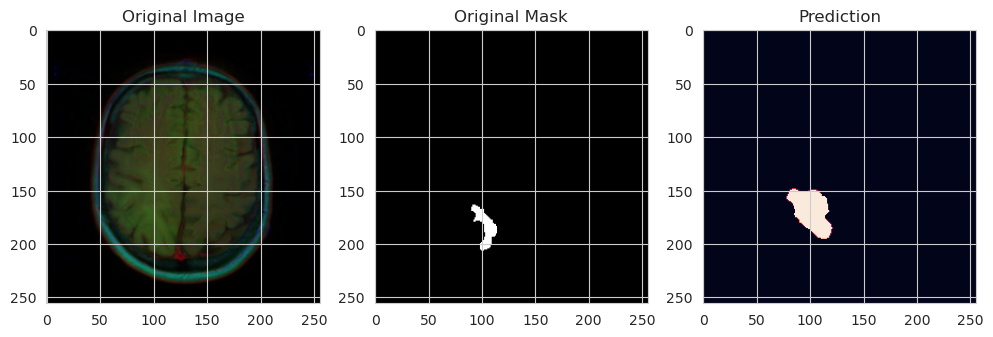

1/1 [==============================] - 0s 26ms/step


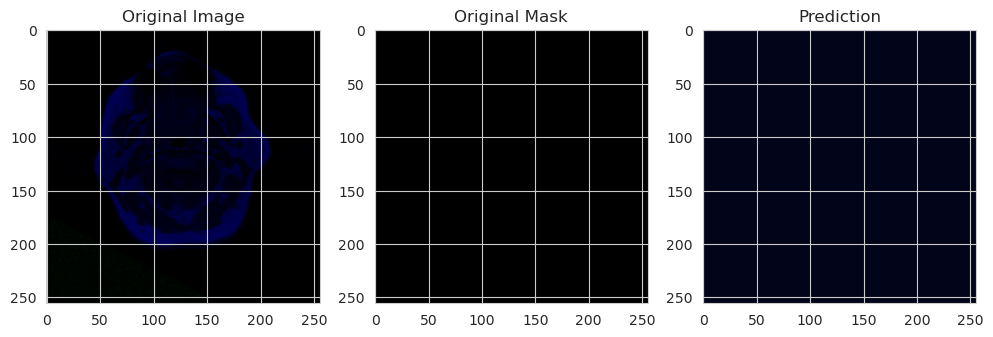

1/1 [==============================] - 0s 51ms/step


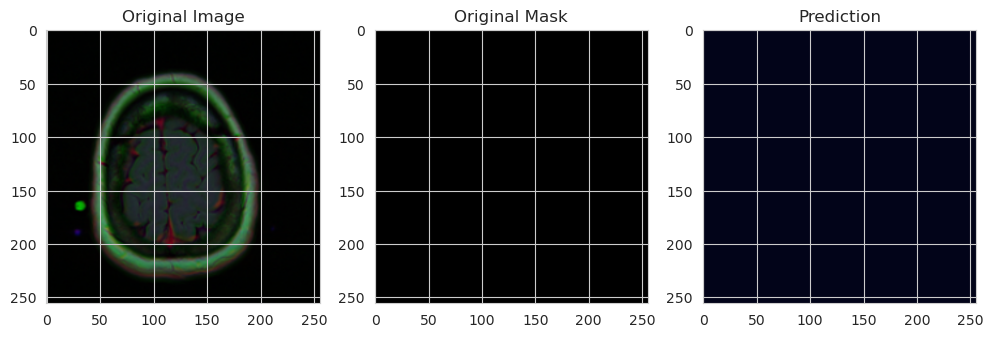

1/1 [==============================] - 0s 25ms/step


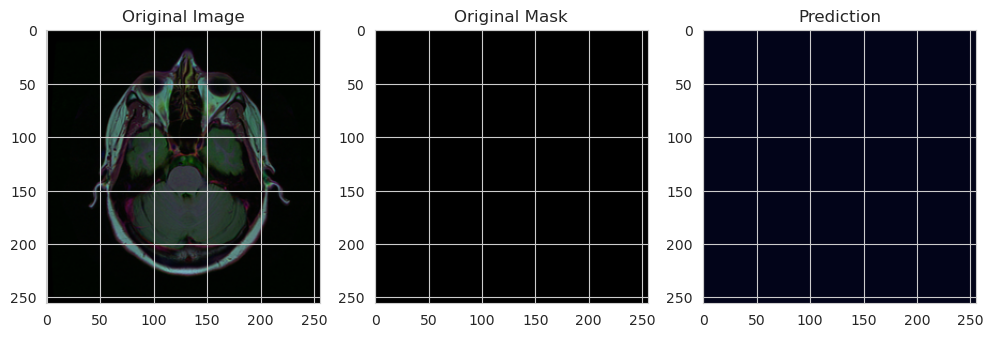

1/1 [==============================] - 0s 28ms/step


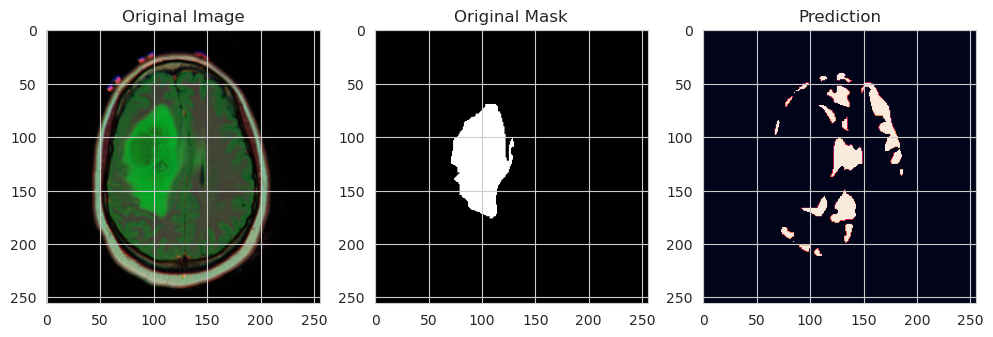

1/1 [==============================] - 0s 26ms/step


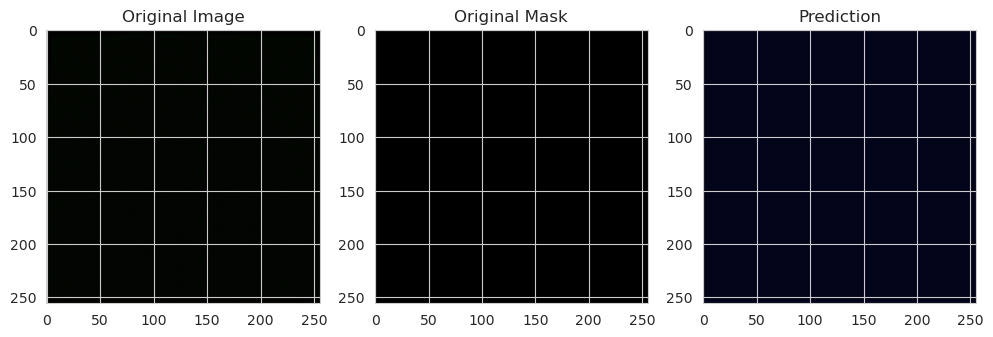

1/1 [==============================] - 0s 26ms/step


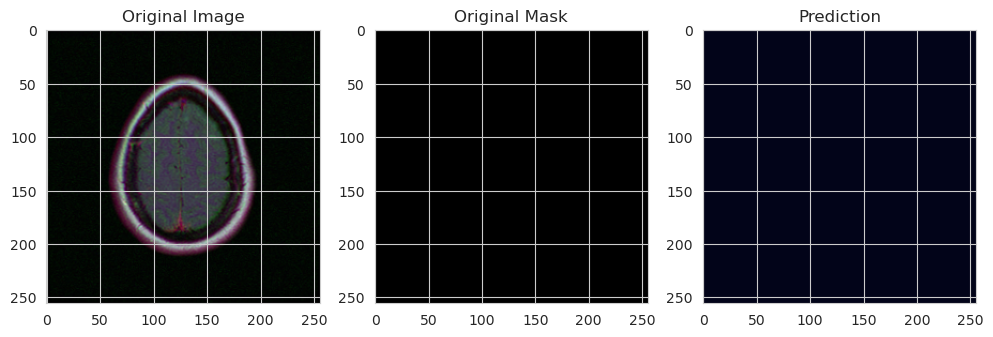

1/1 [==============================] - 0s 26ms/step


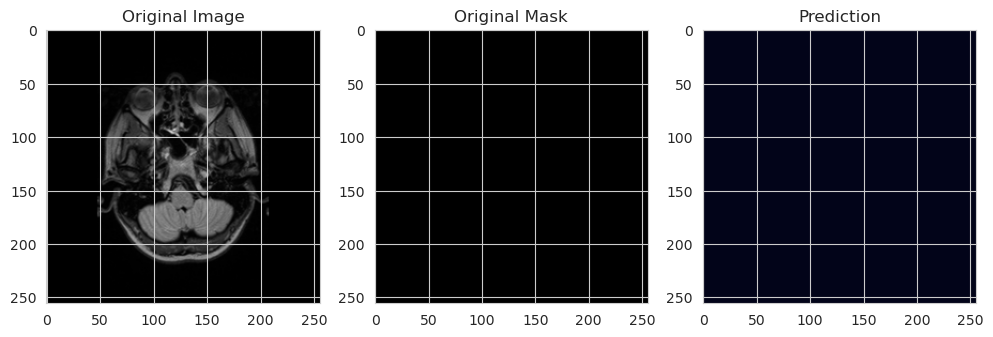

1/1 [==============================] - 0s 27ms/step


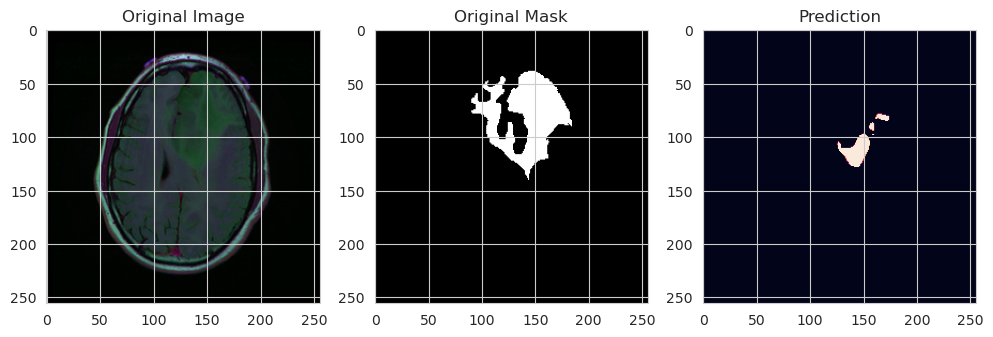

1/1 [==============================] - 0s 25ms/step


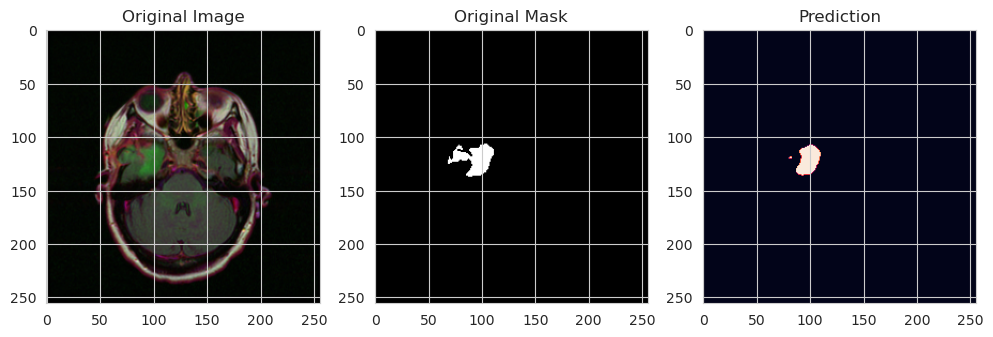

1/1 [==============================] - 0s 24ms/step


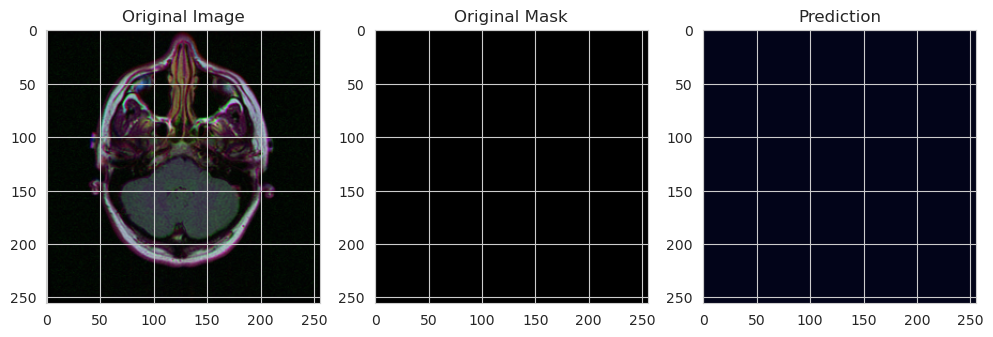

1/1 [==============================] - 0s 26ms/step


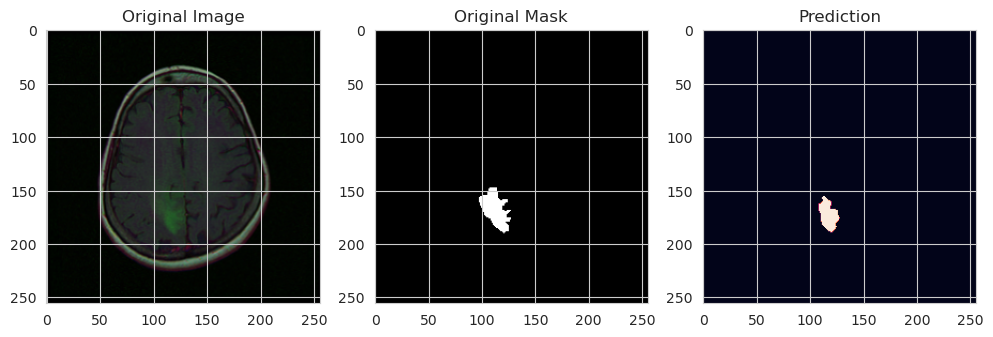

1/1 [==============================] - 0s 24ms/step


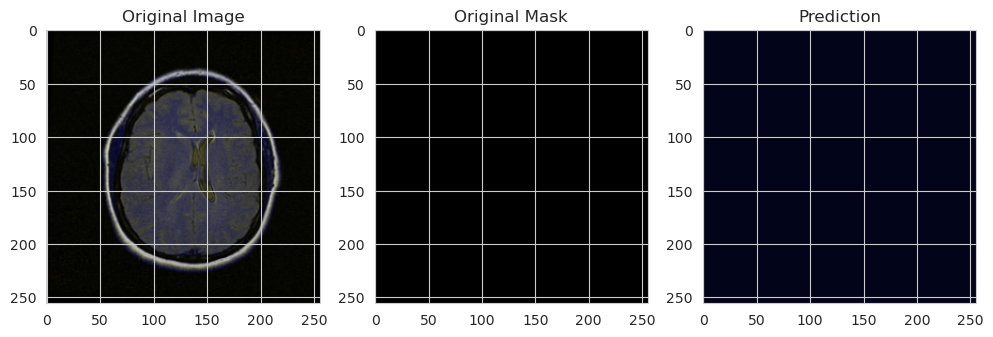

1/1 [==============================] - 0s 23ms/step


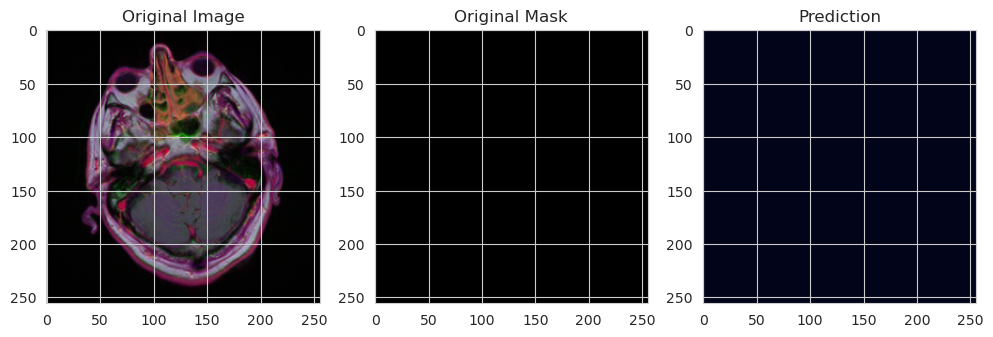

1/1 [==============================] - 0s 26ms/step


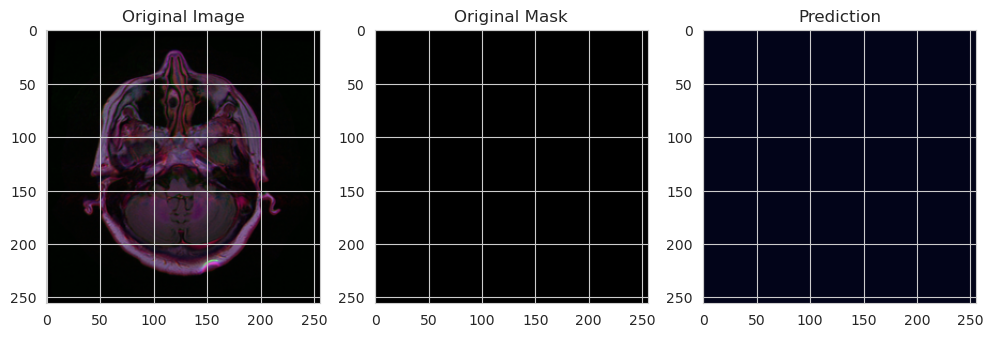

In [35]:
plot_segmentation_result(model_vggV0)

#### train vgg16 for 120 epochs

In [20]:
model_vggV1=build_vgg16_unet(input_shape)
model_vggV1.summary()


58889256/58889256 [==============================] - 0s 0us/step

Model: "VGG16_U-Net"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               

                                )]                                                                

                                                                                                  

 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_3[0][0]']                

                                )                                                                 

                                                                                                  

 block1_conv2 (Conv2D)          (None, 256, 256, 64  36928       ['block1_conv1[0][0]']           

          

In [21]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=1e-4,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
callbacks_vgg_1 = [ModelCheckpoint('vggV1.hdf5', verbose=1,
                                      save_best_only=True)]
metrics=["binary_accuracy", iou, dice_coef]

In [22]:

model_vggV1.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)

In [23]:
history_vggV1 = model_vggV1.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_vgg_1,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.

Found 2828 validated image filenames.

Epoch 1/120

89/88 [==============================] - ETA: -1s - loss: 0.0252 - binary_accuracy: 0.9647 - iou: 0.0436 - dice_coef: 0.9748Found 708 validated image filenames.

Found 708 validated image filenames.



Epoch 1: val_loss improved from inf to 0.07543, saving model to vggV1.hdf5

88/88 [==============================] - 220s 2s/step - loss: 0.0252 - binary_accuracy: 0.9647 - iou: 0.0436 - dice_coef: 0.9748 - val_loss: 0.0754 - val_binary_accuracy: 0.9878 - val_iou: 0.0170 - val_dice_coef: 0.9246

Epoch 2/120

89/88 [==============================] - ETA: 0s - loss: 0.0049 - binary_accuracy: 0.9911 - iou: 0.0764 - dice_coef: 0.9951

Epoch 2: val_loss improved from 0.07543 to 0.00701, saving model to vggV1.hdf5

88/88 [==============================] - 153s 2s/step - loss: 0.0049 - binary_accuracy: 0.9911 - iou: 0.0764 - dice_coef: 0.9951 - val_loss: 0.0070 - val_binary_accuracy: 0.9923 - val_iou: 0.0

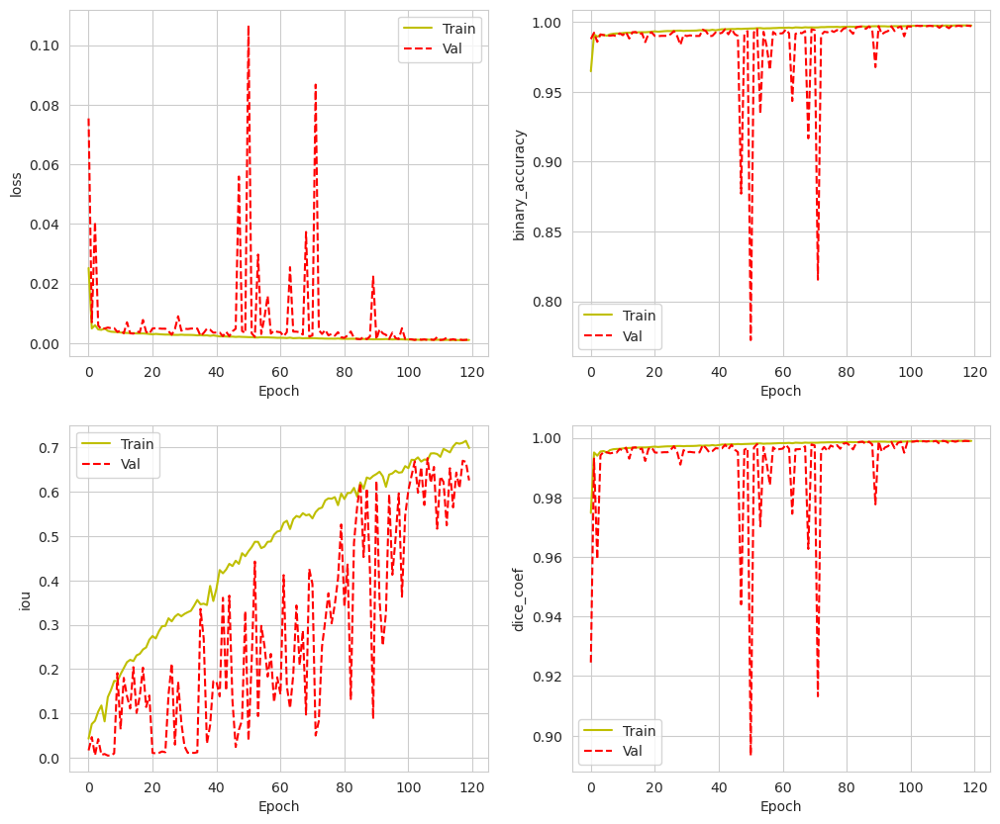

In [24]:
plot_metrics(history_vggV1)

In [27]:
#Evaluate trained vggV1 model
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
results_vggV1 = model_vggV1.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_vggV1[0] )
print('Test Binary Accuracy ', results_vggV1[1] )
print('Test IoU ', results_vggV1[2] )
print('Test Dice Coefficient ', results_vggV1[3] )

Test Loss  0.0011961989803239703

Test Binary Accuracy  0.9970813393592834

Test IoU  0.6399990916252136

Test Dice Coefficient  0.9988038539886475


### ResNet50 (retrain all layer) 

In [21]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_resnet50_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = resnet50.get_layer("input_4").output           ## (512 x 512)
    s2 = resnet50.get_layer("conv1_relu").output      ## (256 x 256)
    s3 = resnet50.get_layer("conv2_block3_out").output  ## (128 x 128)
    s4 = resnet50.get_layer("conv3_block4_out").output  ## (64 x 64)

    """ Bridge """
    b1 = resnet50.get_layer("conv4_block6_out").output  ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    
    model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model


In [22]:
input_shape = (256, 256, 3)
resnet_V0=build_resnet50_unet(input_shape)
resnet_V0.summary()


Model: "ResNet50_U-Net"

__________________________________________________________________________________________________

 Layer (type)                   Output Shape         Param #     Connected to                     


 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               

                                )]                                                                

                                                                                                  

 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_4[0][0]']                

                                                                                                  

 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              

                                )                                                                 

                                                                          

In [23]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

callbacks_resnet_V0 = [
        ModelCheckpoint('resnet_V0.hdf5', verbose=1,save_best_only=True),
        ReduceLROnPlateau(monitor='val_iou', factor=0.5, min_delta=0.0000001, patience=20, min_lr=1e-7, verbose=1),
        ]

optimizer = Adam(learning_rate=learning_rate)

metrics=["binary_accuracy", iou, dice_coef]
resnet_V0.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)

In [24]:
history_resnet_V0 = resnet_V0.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_resnet_V0,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Epoch 1/120

89/88 [==============================] - ETA: 0s - loss: 0.0184 - binary_accuracy: 0.9716 - iou: 0.0581 - dice_coef: 0.9816

Epoch 1: val_loss improved from inf to 0.03449, saving model to resnet_V0.hdf5

88/88 [==============================] - 129s 1s/step - loss: 0.0184 - binary_accuracy: 0.9716 - iou: 0.0581 - dice_coef: 0.9816 - val_loss: 0.0345 - val_binary_accuracy: 0.9899 - val_iou: 0.0110 - val_dice_coef: 0.9655 - lr: 0.0010

Epoch 2/120

89/88 [==============================] - ETA: 0s - loss: 0.0043 - binary_accuracy: 0.9928 - iou: 0.1130 - dice_coef: 0.9957

Epoch 2: val_loss improved from 0.03449 to 0.00613, saving model to resnet_V0.hdf5

88/88 [==============================] - 93s 1s/step - loss: 0.0043 - binary_accuracy: 0.9928 - iou: 0.1130 - dice_coef: 0.9957 - val_loss: 0.0061 - val_binary_accuracy: 0.9905 - val_iou: 0.0089 - val_dice_coef: 0.9939 - lr: 0.0010

Epoch 3/120

89/88 [==============================] - ETA: 0s - loss: 0.0033 - binary_accurac

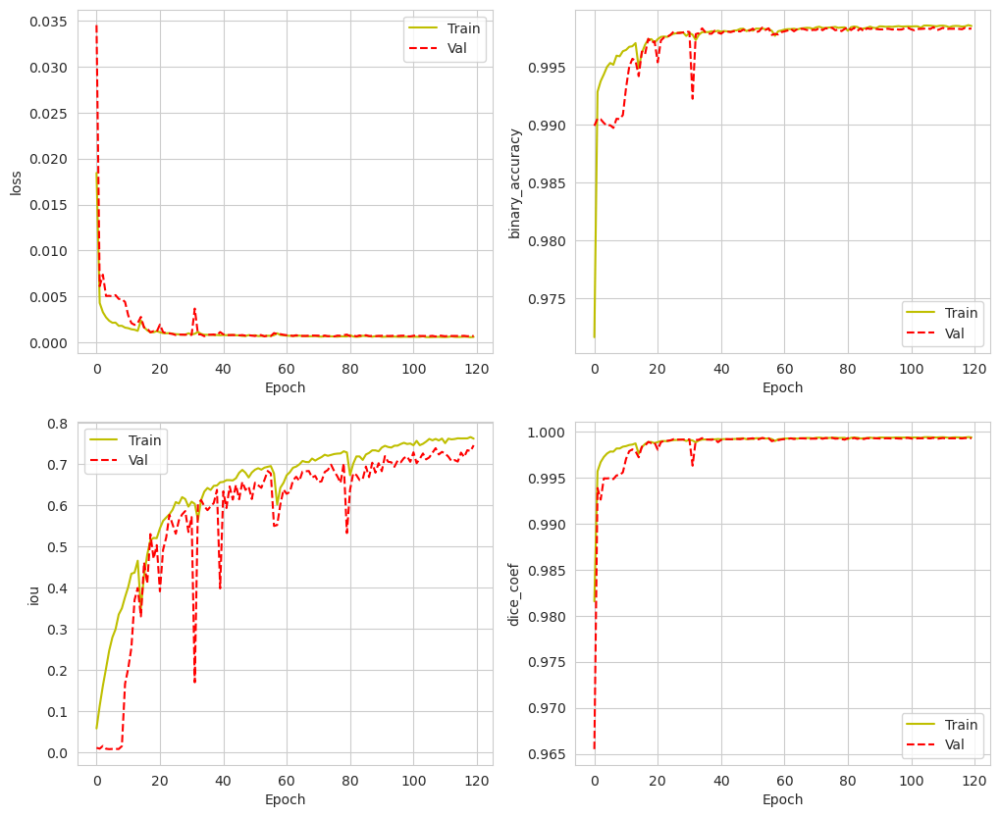

In [25]:
plot_metrics(history_resnet_V0)

In [27]:
#Evaluate trained vgg model
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
results_resnet_V0 = resnet_V0.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_resnet_V0[0] )
print('Test Binary Accuracy ', results_resnet_V0[1] )
print('Test IoU ', results_resnet_V0[2] )
print('Test Dice Coefficient ', results_resnet_V0[3] )

Test Loss  0.0006896604900248349

Test Binary Accuracy  0.9983338713645935

Test IoU  0.7329578399658203

Test Dice Coefficient  0.9993103742599487


1/1 [==============================] - 1s 1s/step


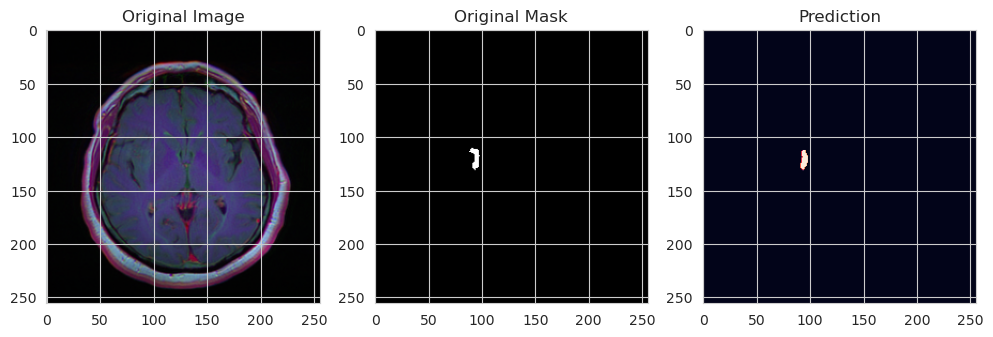

1/1 [==============================] - 0s 29ms/step


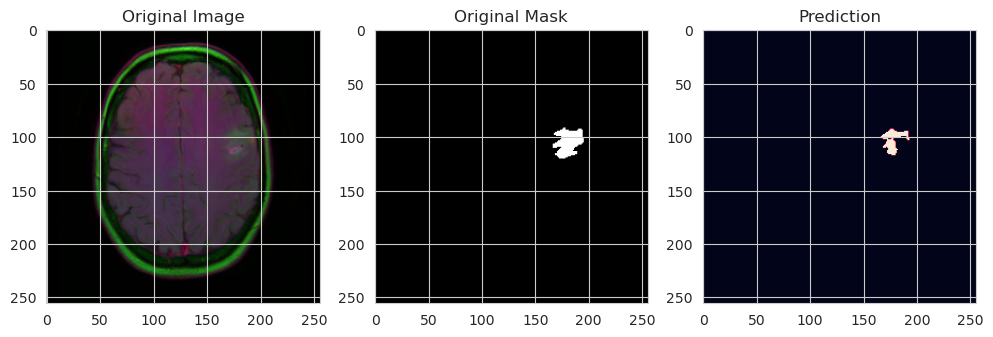

1/1 [==============================] - 0s 32ms/step


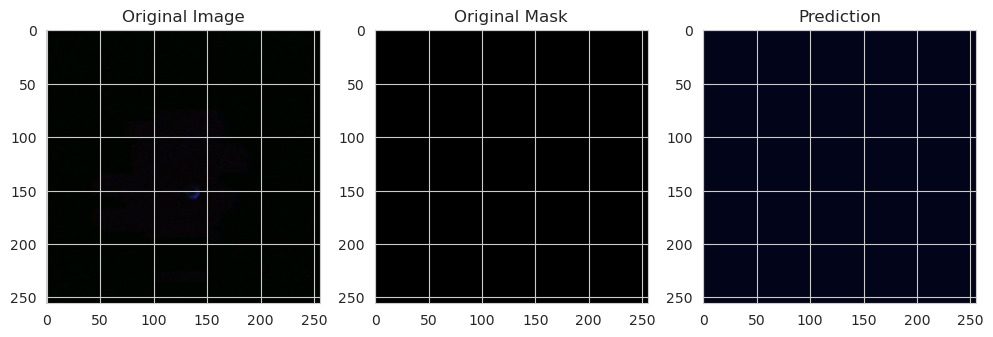

1/1 [==============================] - 0s 32ms/step


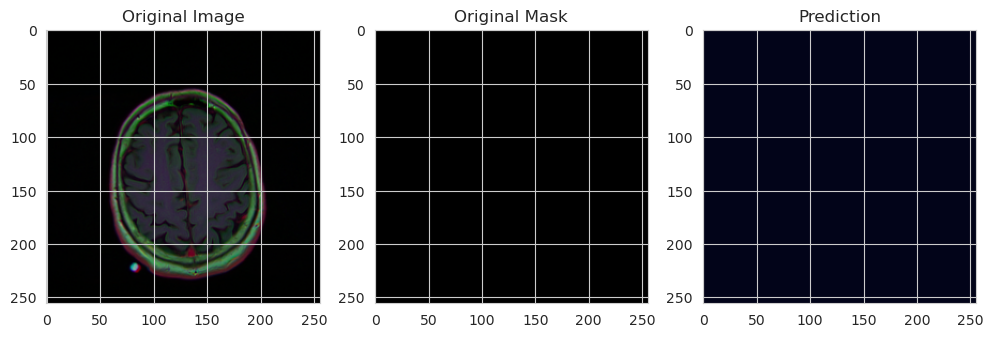

1/1 [==============================] - 0s 32ms/step


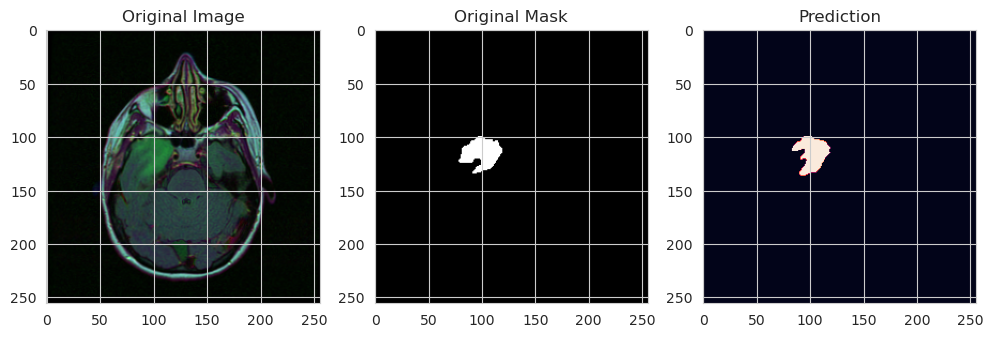

1/1 [==============================] - 0s 33ms/step


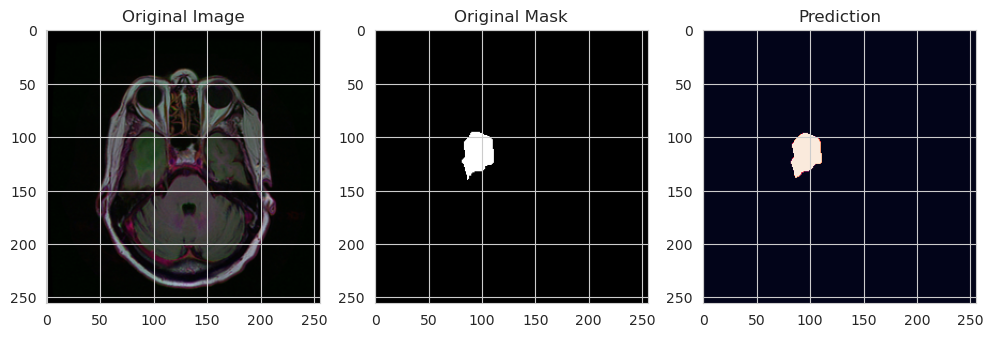

1/1 [==============================] - 0s 32ms/step


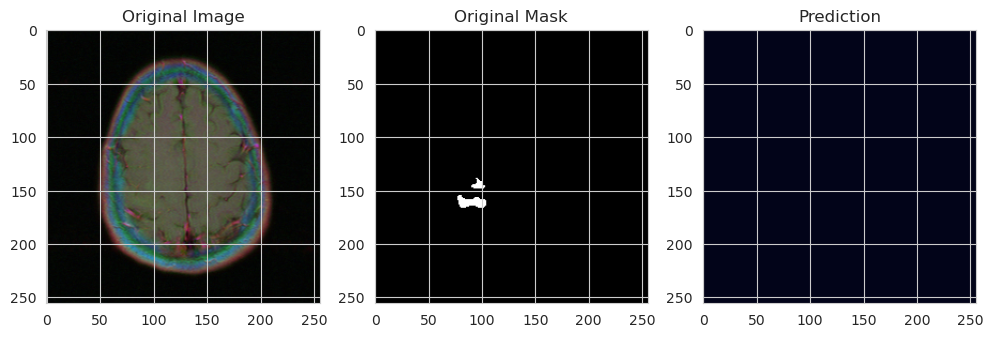

1/1 [==============================] - 0s 32ms/step


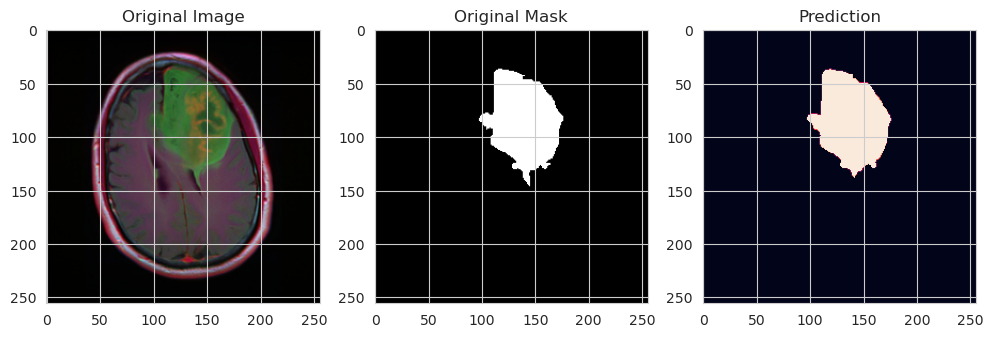

1/1 [==============================] - 0s 29ms/step


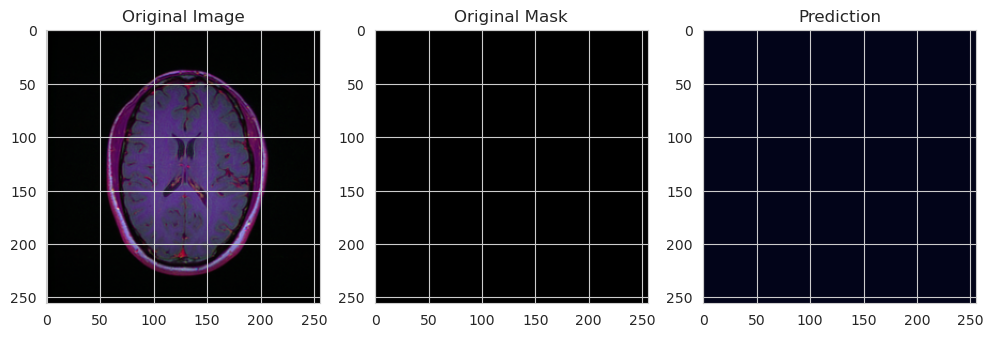

1/1 [==============================] - 0s 40ms/step


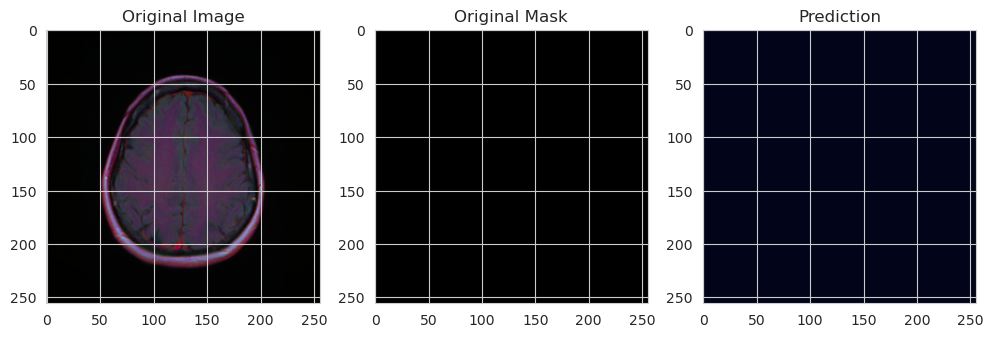

1/1 [==============================] - 0s 41ms/step


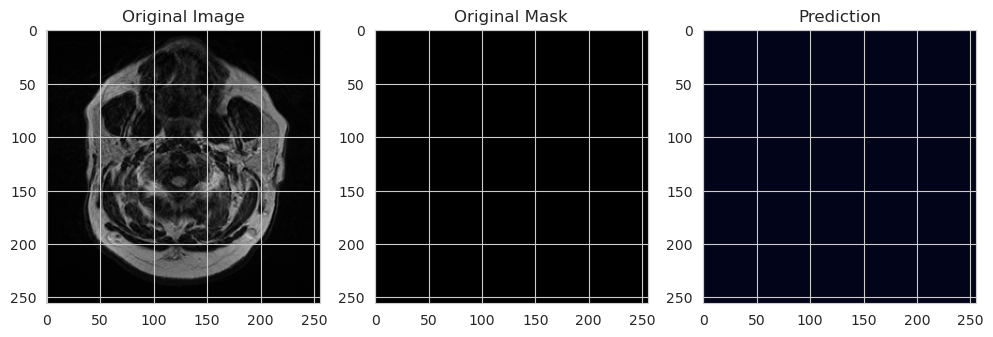

1/1 [==============================] - 0s 29ms/step


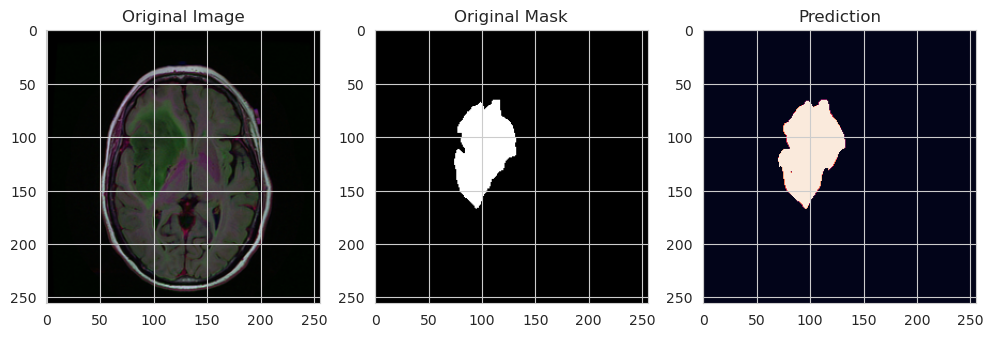

1/1 [==============================] - 0s 31ms/step


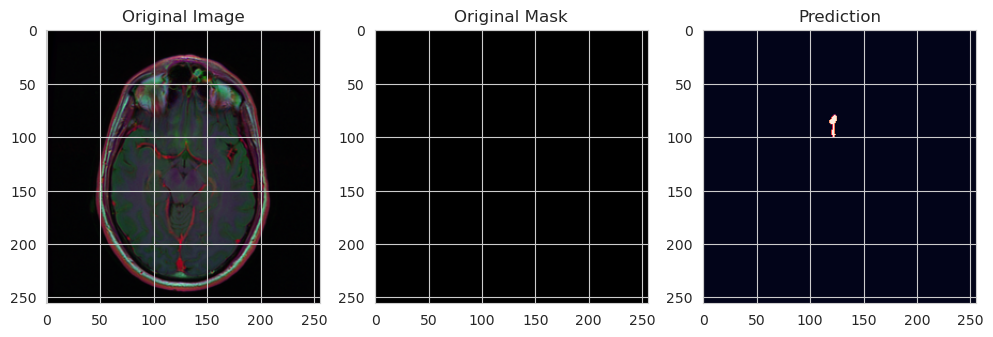

1/1 [==============================] - 0s 28ms/step


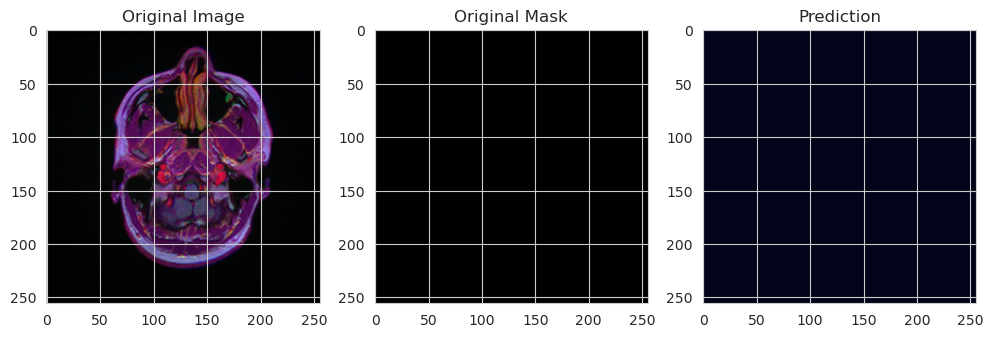

1/1 [==============================] - 0s 32ms/step


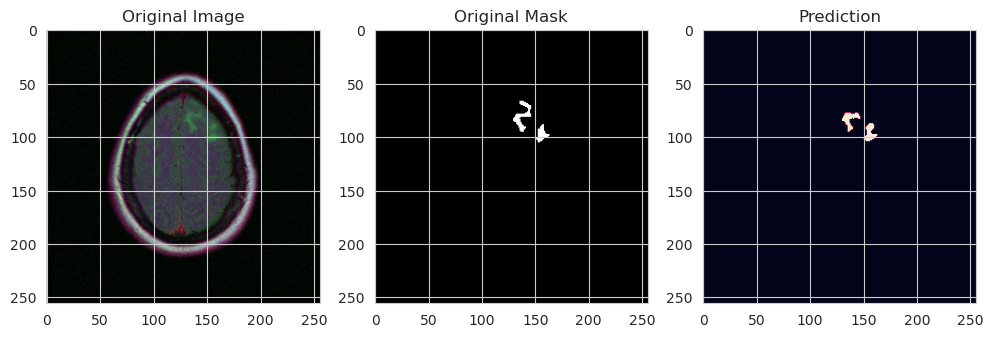

1/1 [==============================] - 0s 32ms/step


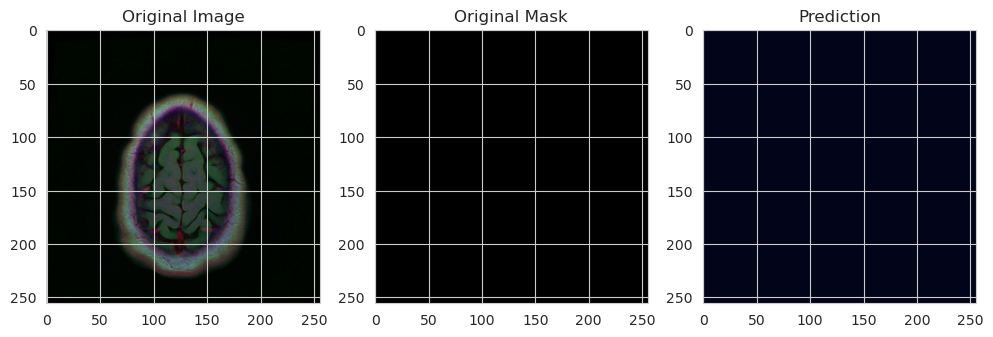

1/1 [==============================] - 0s 37ms/step


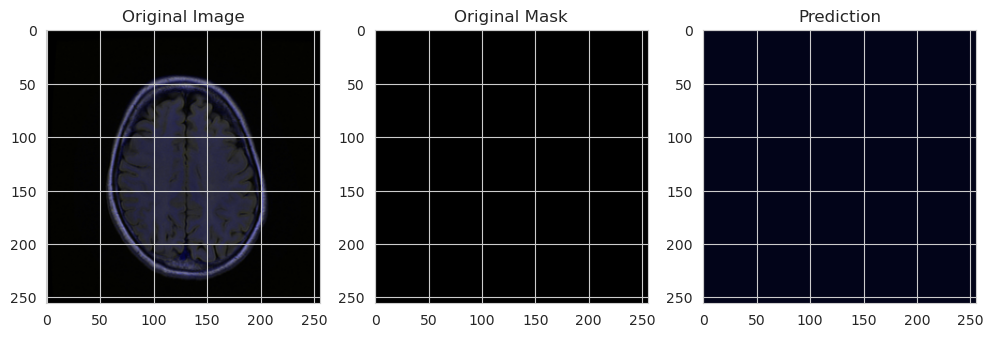

1/1 [==============================] - 0s 33ms/step


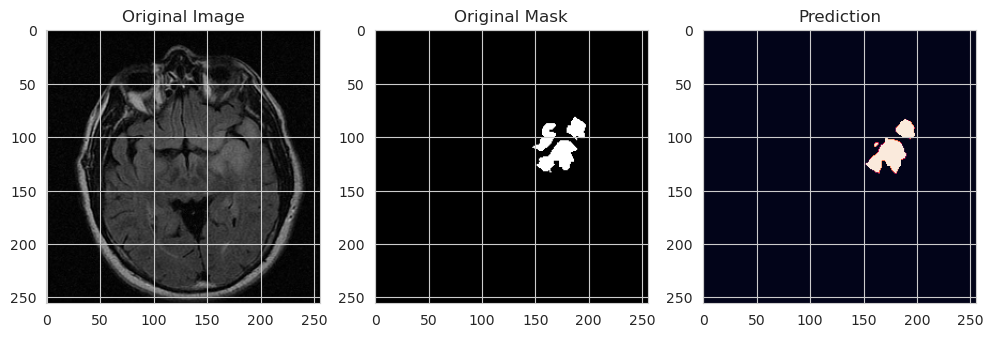

1/1 [==============================] - 0s 33ms/step


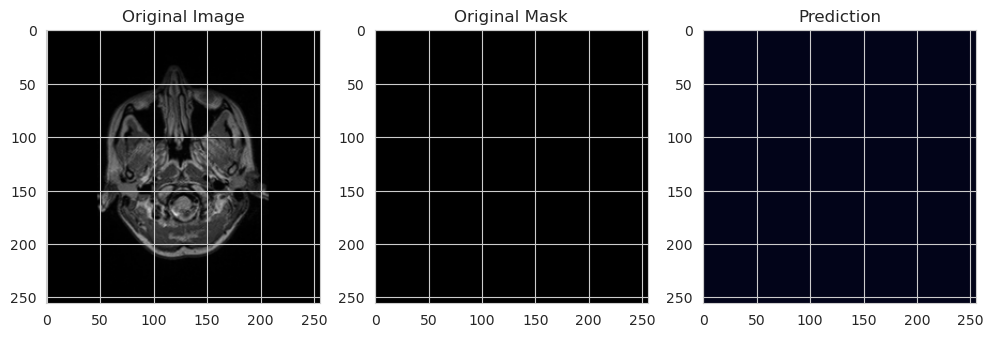

1/1 [==============================] - 0s 33ms/step


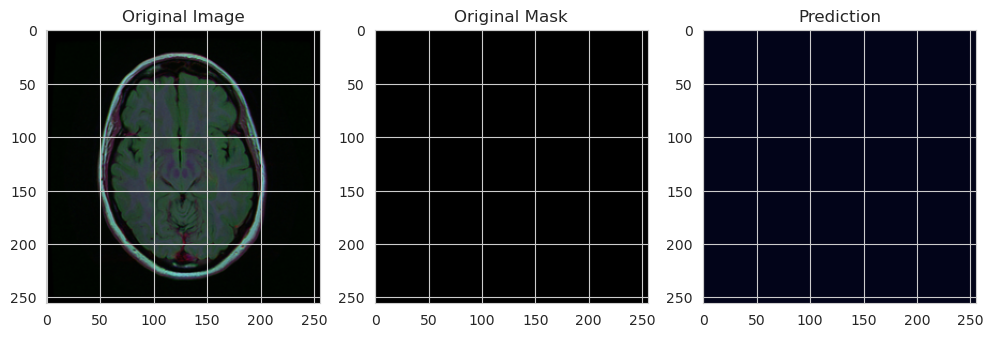

In [28]:
plot_segmentation_result(resnet_V0)

In [29]:
resnet_V0.save('resnet_V0.hdf5')

### ResNet50 (freeze first two conv blocks) 

In [7]:
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPool2D, Conv2DTranspose, Concatenate, Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import ResNet50

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_partail_resnet50_unet(input_shape):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet50 = ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = resnet50.get_layer("input_1").output           ## (512 x 512)
    s2 = resnet50.get_layer("conv1_relu").output      ## (256 x 256)
    s3 = resnet50.get_layer("conv2_block3_out").output  ## (128 x 128)
    s4 = resnet50.get_layer("conv3_block4_out").output  ## (64 x 64)

    """ Bridge """
    b1 = resnet50.get_layer("conv4_block6_out").output  ## (32 x 32)

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     ## (64 x 64)
    d2 = decoder_block(d1, s3, 256)                     ## (128 x 128)
    d3 = decoder_block(d2, s2, 128)                     ## (256 x 256)
    d4 = decoder_block(d3, s1, 64)                      ## (512 x 512)

    """ Output """
    outputs = Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    
    model = Model(inputs, outputs, name="ResNet50_U-Net")
    for layer in model.layers[:29]:
        layer.trainable = False
    
    return model



In [8]:
input_shape = (256, 256, 3)
resnet_V1=build_partail_resnet50_unet(input_shape)
resnet_V1.summary()

94765736/94765736 [==============================] - 3s 0us/step
Model: "ResNet50_U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                    

In [9]:
for l in resnet_V1.layers:
    print(l.name, l.trainable)

input_1 False
conv1_pad False
conv1_conv False
conv1_bn False
conv1_relu False
pool1_pad False
pool1_pool False
conv2_block1_1_conv False
conv2_block1_1_bn False
conv2_block1_1_relu False
conv2_block1_2_conv False
conv2_block1_2_bn False
conv2_block1_2_relu False
conv2_block1_0_conv False
conv2_block1_3_conv False
conv2_block1_0_bn False
conv2_block1_3_bn False
conv2_block1_add False
conv2_block1_out False
conv2_block2_1_conv False
conv2_block2_1_bn False
conv2_block2_1_relu False
conv2_block2_2_conv False
conv2_block2_2_bn False
conv2_block2_2_relu False
conv2_block2_3_conv False
conv2_block2_3_bn False
conv2_block2_add False
conv2_block2_out False
conv2_block3_1_conv True
conv2_block3_1_bn True
conv2_block3_1_relu True
conv2_block3_2_conv True
conv2_block3_2_bn True
conv2_block3_2_relu True
conv2_block3_3_conv True
conv2_block3_3_bn True
conv2_block3_add True
conv2_block3_out True
conv3_block1_1_conv True
conv3_block1_1_bn True
conv3_block1_1_relu True
conv3_block1_2_conv True
conv3_

In [18]:
EPOCHS = 120
BATCH_SIZE = 32
learning_rate = 1e-3

num_train_steps = len(df_train) * EPOCHS
lr_scheduler = PolynomialDecay(initial_learning_rate=learning_rate,end_learning_rate=1e-4,
                               decay_steps=num_train_steps)
optimizer = Adam(learning_rate=lr_scheduler)
callbacks_resnet_v1 = [ModelCheckpoint('resnet_v1.hdf5', verbose=1,
                                      save_best_only=True)]
metrics=["binary_accuracy", iou, dice_coef]

In [20]:
resnet_V1.compile(optimizer=optimizer, loss=dice_coef_loss, 
              metrics=metrics)
history_resnetV1 = resnet_V1.fit(train_gen,
                    steps_per_epoch=len(df_train) / BATCH_SIZE, 
                    epochs=EPOCHS, 
                    callbacks=callbacks_resnet_v1,
                    validation_data = val_gen,
                    validation_steps=len(df_val) / BATCH_SIZE)

Found 2828 validated image filenames.
Found 2828 validated image filenames.
Epoch 1/120
89/88 [==============================] - ETA: 0s - loss: 0.0213 - binary_accuracy: 0.9669 - iou: 0.0094 - dice_coef: 0.9787Found 708 validated image filenames.
Found 708 validated image filenames.

Epoch 1: val_loss improved from inf to 0.49023, saving model to resnet_v1.hdf5
88/88 [==============================] - 173s 2s/step - loss: 0.0213 - binary_accuracy: 0.9669 - iou: 0.0094 - dice_coef: 0.9787 - val_loss: 0.4902 - val_binary_accuracy: 0.0137 - val_iou: 0.0093 - val_dice_coef: 0.5098
Epoch 2/120
89/88 [==============================] - ETA: 0s - loss: 0.0072 - binary_accuracy: 0.9877 - iou: 0.0114 - dice_coef: 0.9928
Epoch 2: val_loss improved from 0.49023 to 0.33112, saving model to resnet_v1.hdf5
88/88 [==============================] - 84s 955ms/step - loss: 0.0072 - binary_accuracy: 0.9877 - iou: 0.0114 - dice_coef: 0.9928 - val_loss: 0.3311 - val_binary_accuracy: 0.3369 - val_iou: 0.010

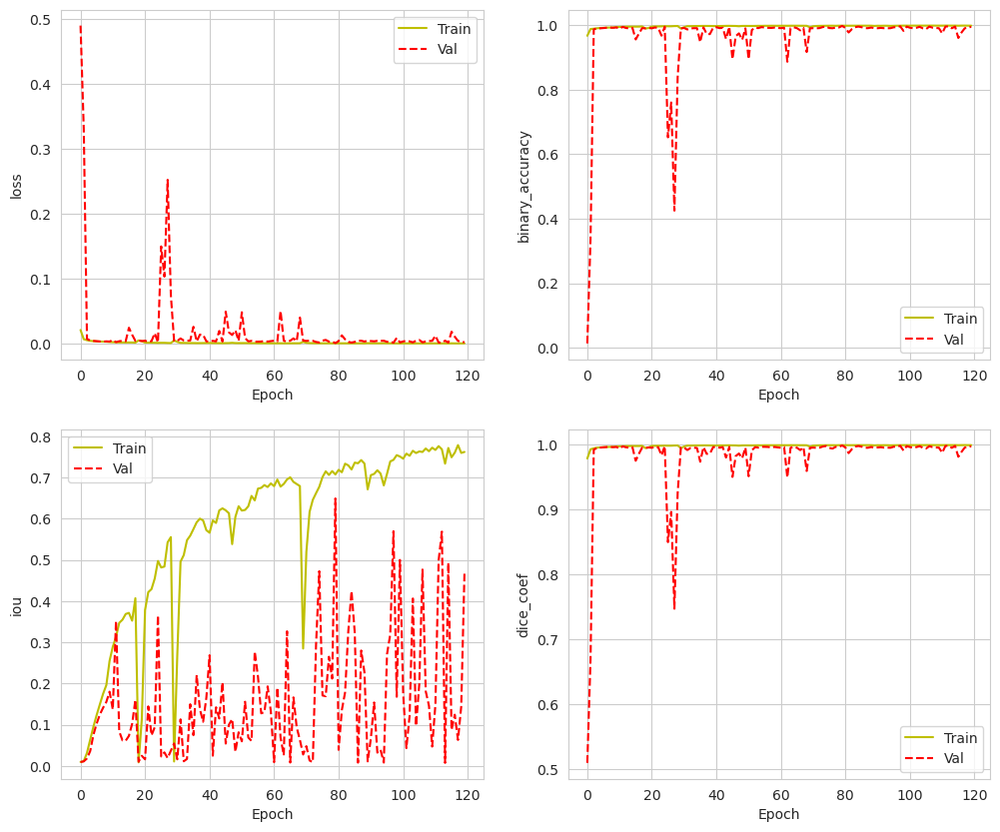

In [21]:
plot_metrics(history_resnetV1)

In [22]:
#Evaluate trained vgg model
test_gen = train_generator(df_test, BATCH_SIZE, dict(), target_size=(im_height, im_width))
results_resnet_V1 = resnet_V1.evaluate(test_gen, steps=len(df_test) / BATCH_SIZE )

print('Test Loss ', results_resnet_V1[0] )
print('Test Binary Accuracy ', results_resnet_V1[1] )
print('Test IoU ', results_resnet_V1[2] )
print('Test Dice Coefficient ', results_resnet_V1[3] )

Found 393 validated image filenames.
Found 393 validated image filenames.
12/12 [==============================] - 8s 660ms/step - loss: 0.0029 - binary_accuracy: 0.9938 - iou: 0.4681 - dice_coef: 0.9971
Test Loss  0.002926257438957691
Test Binary Accuracy  0.9937514066696167
Test IoU  0.4680875241756439
Test Dice Coefficient  0.9970738291740417


1/1 [==============================] - 1s 1s/step


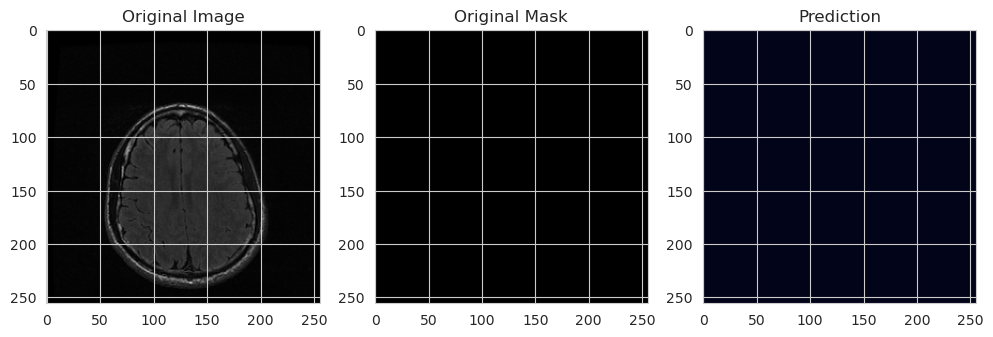

1/1 [==============================] - 0s 26ms/step


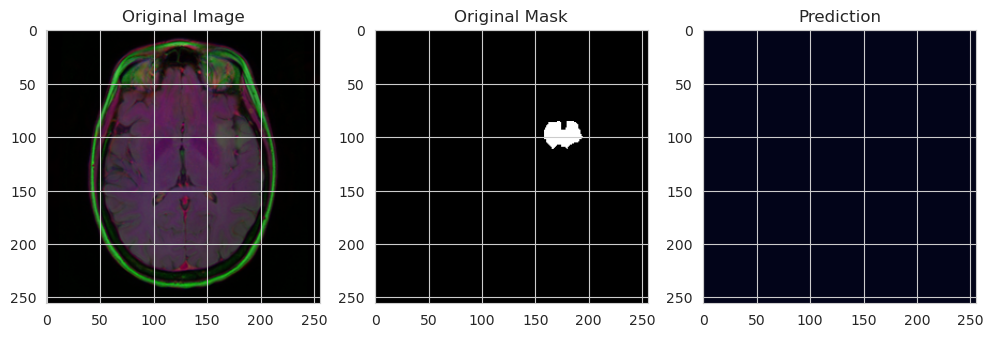

1/1 [==============================] - 0s 25ms/step


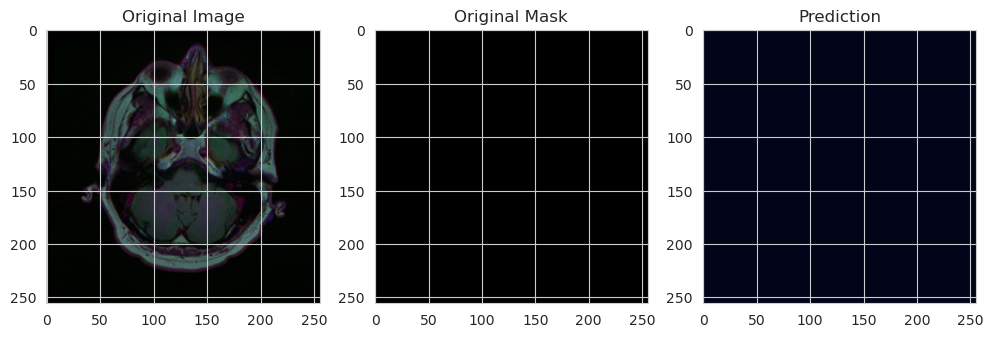

1/1 [==============================] - 0s 27ms/step


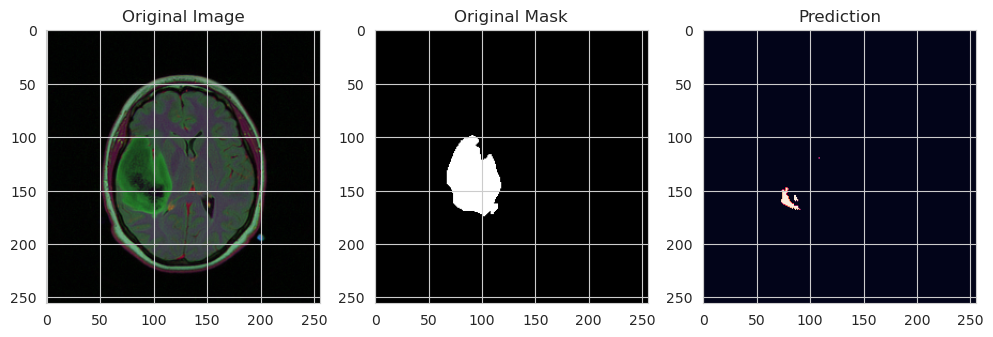

1/1 [==============================] - 0s 27ms/step


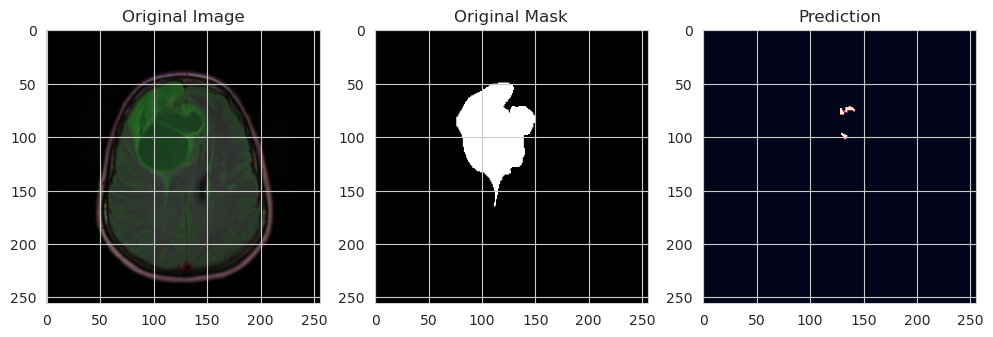

1/1 [==============================] - 0s 25ms/step


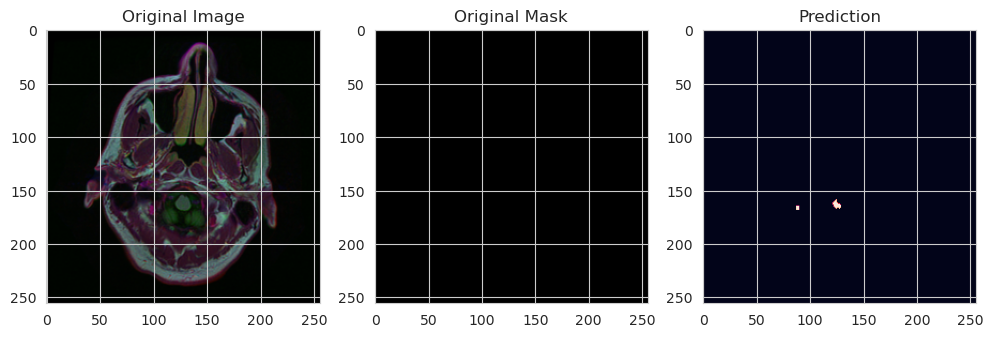

1/1 [==============================] - 0s 28ms/step


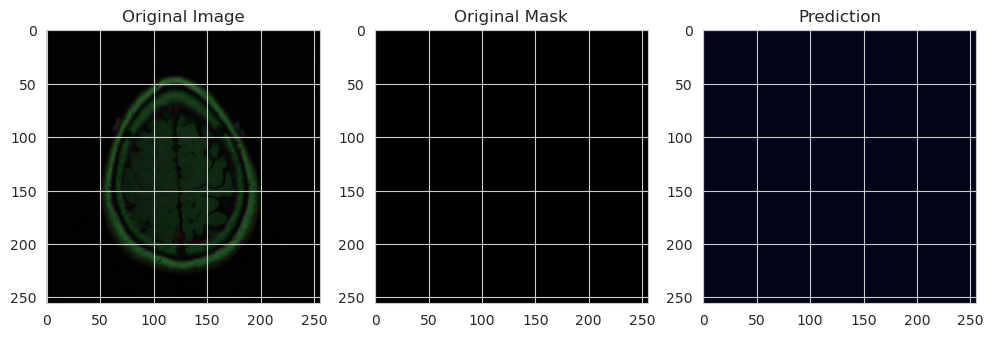

1/1 [==============================] - 0s 25ms/step


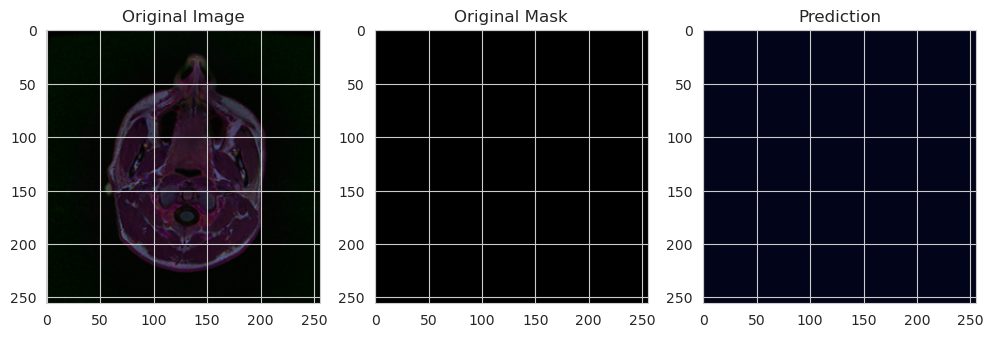

1/1 [==============================] - 0s 26ms/step


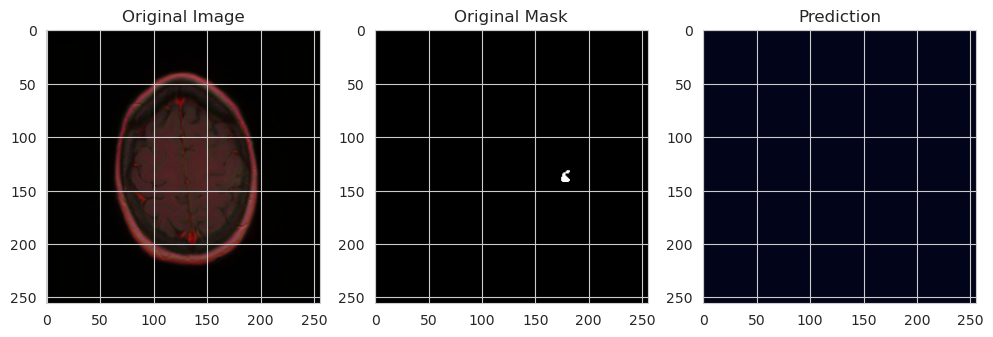

1/1 [==============================] - 0s 25ms/step


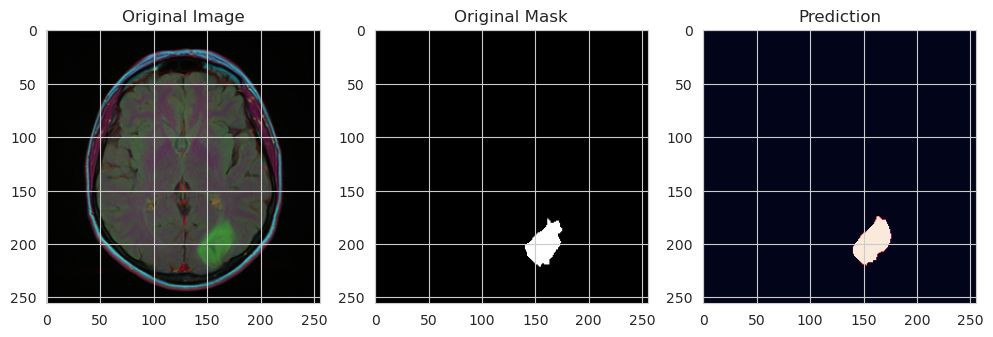

1/1 [==============================] - 0s 25ms/step


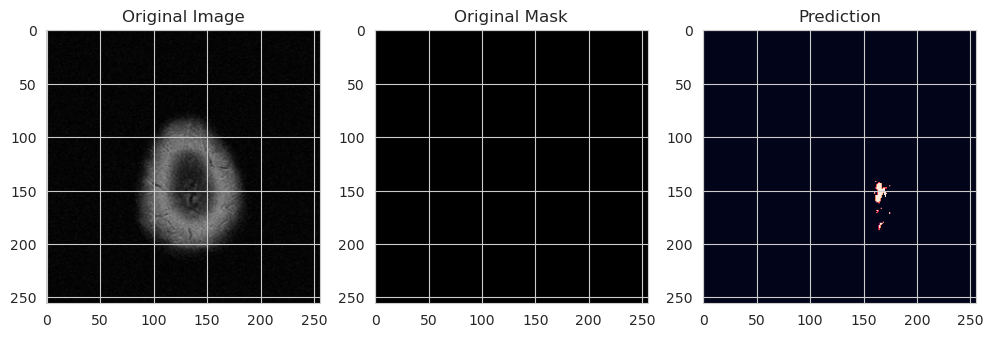

1/1 [==============================] - 0s 24ms/step


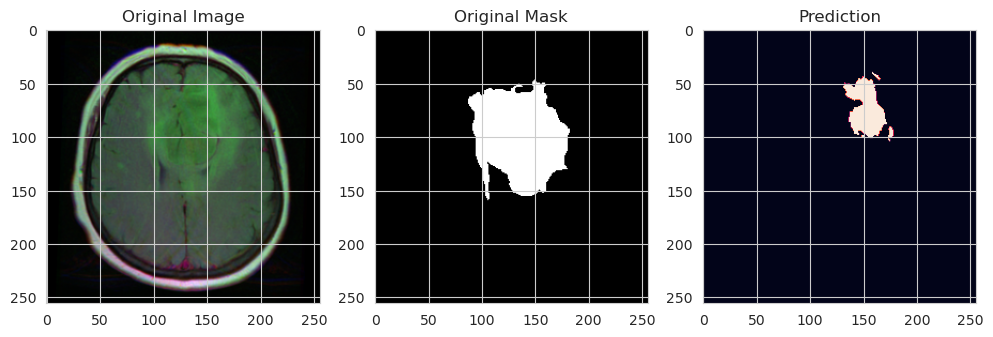

1/1 [==============================] - 0s 24ms/step


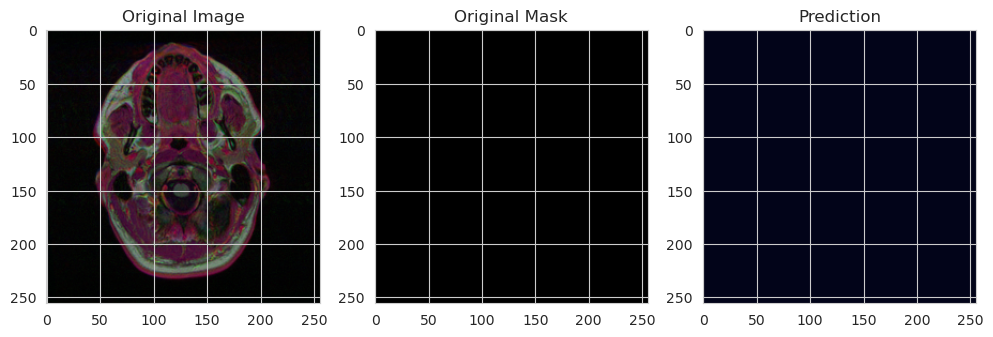

1/1 [==============================] - 0s 26ms/step


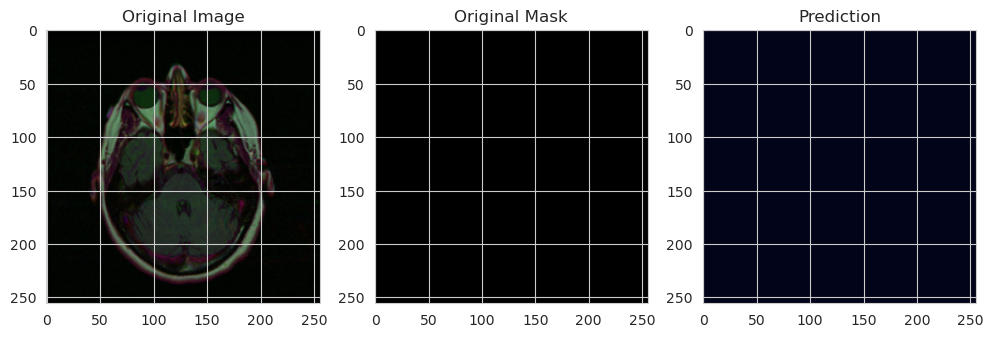

1/1 [==============================] - 0s 27ms/step


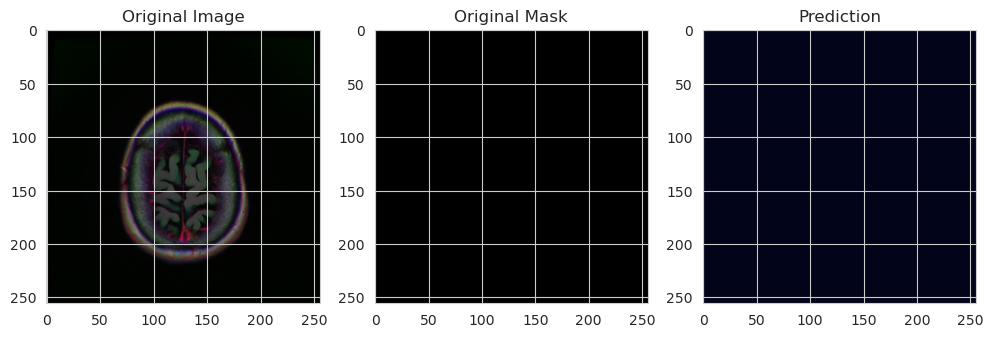

1/1 [==============================] - 0s 28ms/step


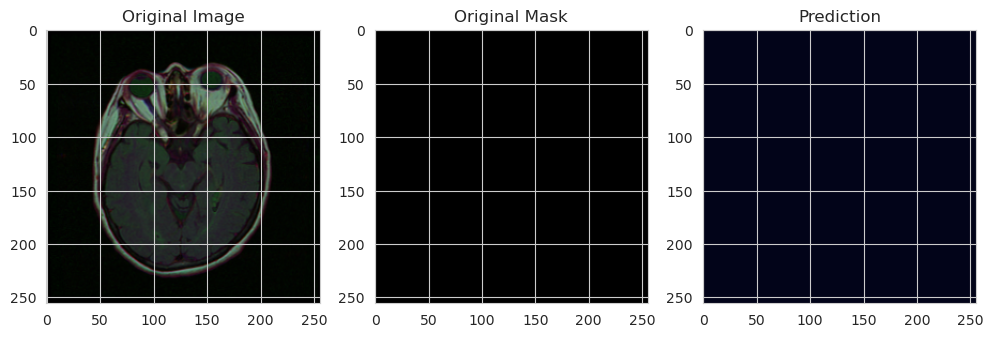

1/1 [==============================] - 0s 28ms/step


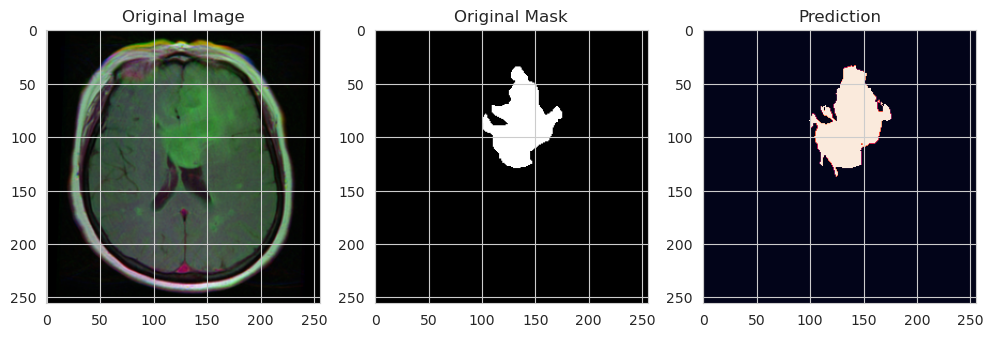

1/1 [==============================] - 0s 29ms/step


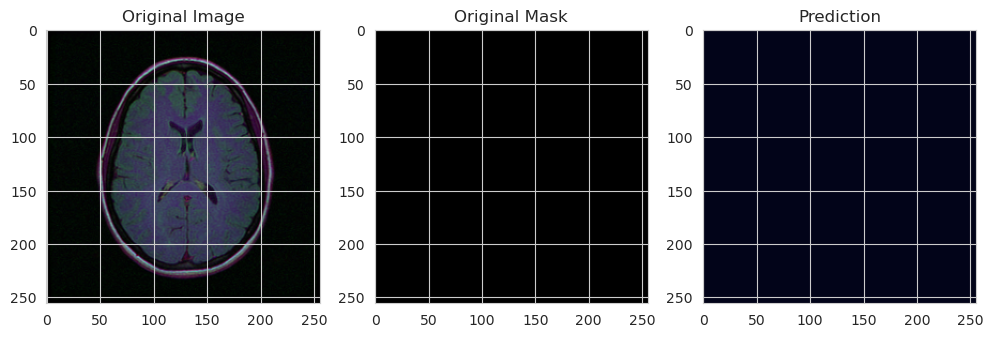

1/1 [==============================] - 0s 28ms/step


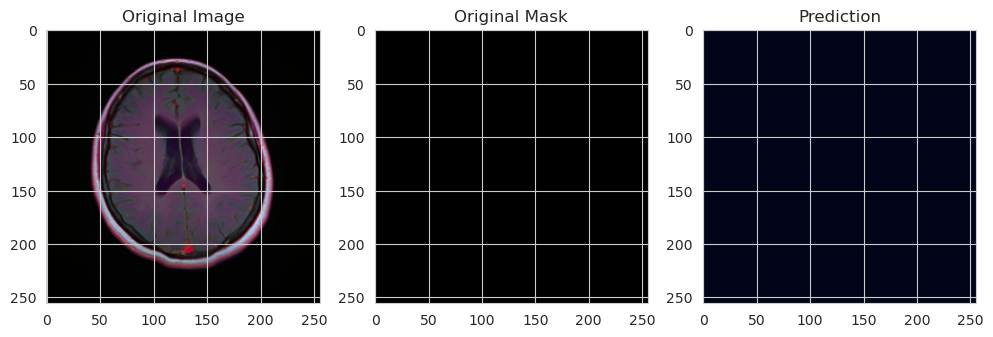

1/1 [==============================] - 0s 26ms/step


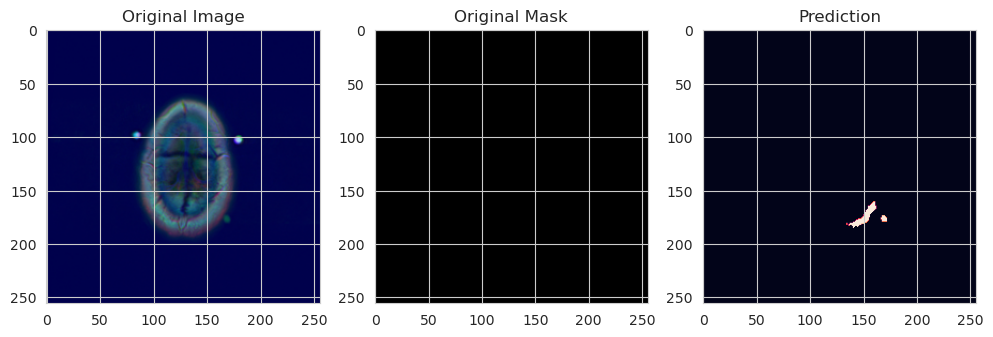

In [25]:
plot_segmentation_result(resnet_V1)

### result comparison

In [4]:
test_results = pd.DataFrame(
    {'unet': results_unet,
     'vgg16': results_vggV1,
     'resnet50': results_resnet_V0,
     'partial_resnet50': results_resnet_V1
     },
    index=['Loss', 'Binary_Accuracy', 'IoU', 'Dice_Coefficient'])
test_results 

,unet,vgg16,resnet50,partial_resnet50
Loss,0.000714,0.001196,0.000690,0.002926
Binary_Accuracy,0.998279,0.997081,0.998334,0.993751
IoU,0.703022,0.639999,0.732958,0.468088
Dice_Coefficient,0.999286,0.998804,0.999310,0.997074


#### Conclusion:
1. Unet and resnet50 (retrain all layer) gave better results.
2. Resnet50 (freeze first two conv blocks) gave the worst results, so the pretrained weights that was trained on ImageNet classification task didn't work well on medical image .segmentation.
3. Resnet50 (retrain all layer) converge faster then Unet, so the pertained weights helped